###Projeto Final AMAPROB

In [ ]:
# @title Importando as bibliotecas necessárias
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time

# from scipy.optimize import minimize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from scipy.spatial.distance import cdist

In [ ]:
try:
    import ipympl
except ImportError:
    !pip install ipympl
    print("Instalando ipympl... Reinicie o Runtime se necessário.")

from google.colab import output
output.enable_custom_widget_manager()

%matplotlib widget

from matplotlib.widgets import RectangleSelector

In [ ]:
!pip install scikit-optimize

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 2.1 MB/s eta 0:00:00


In [ ]:
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
from skopt.plots import plot_convergence

In [ ]:
!pip install ucimlrepo

In [ ]:
# @title Carregando o dataset e preparando os dados
from ucimlrepo import fetch_ucirepo

# fetch dataset
bike_sharing = fetch_ucirepo(id=275)

# data (as pandas dataframes)
X = bike_sharing.data.features
y = bike_sharing.data.targets

# metadata
print(bike_sharing.metadata)

# variable information
print(bike_sharing.variables)

{'uci_id': 275, 'name': 'Bike Sharing', 'repository_url': 'https://archive.ics.uci.edu/dataset/275/bike+sharing+dataset', 'data_url': 'https://archive.ics.uci.edu/static/public/275/data.csv', 'abstract': 'This dataset contains the hourly and daily count of rental bikes between years 2011 and 2012 in Capital bikeshare system with the corresponding weather and seasonal information.', 'area': 'Social Science', 'tasks': ['Regression'], 'characteristics': ['Multivariate'], 'num_instances': 17389, 'num_features': 13, 'feature_types': ['Integer', 'Real'], 'demographics': [], 'target_col': ['cnt'], 'index_col': ['instant'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2013, 'last_updated': 'Sun Mar 10 2024', 'dataset_doi': '10.24432/C5W894', 'creators': ['Hadi Fanaee-T'], 'intro_paper': {'ID': 422, 'type': 'NATIVE', 'title': 'Event labeling combining ensemble detectors and background knowledge', 'authors': 'Hadi Fanaee-T, João Gama', 'venue': 'Progress

## EDA

In [ ]:
X.head()

,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed
0,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0
1,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0
2,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0
3,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0
4,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0


In [ ]:
X.describe()

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed
count,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098
std,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340
min,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500
50%,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000
75%,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700
max,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700


In [ ]:
X.describe(include='object')

,dteday
count,17379
unique,731
top,2012-12-31
freq,24


## Ajustando o target 'cnt'

In [ ]:
y.describe()

,cnt
count,17379.000000
mean,189.463088
std,181.387599
min,1.000000
25%,40.000000
50%,142.000000
75%,281.000000
max,977.000000


In [ ]:
log_y = np.log(y.copy())
log_y = log_y.rename(columns={'cnt': 'log_cnt'})
log_y.describe()

,log_cnt
count,17379.000000
mean,4.536082
std,1.486137
min,0.000000
25%,3.688879
50%,4.955827
75%,5.638355
max,6.884487


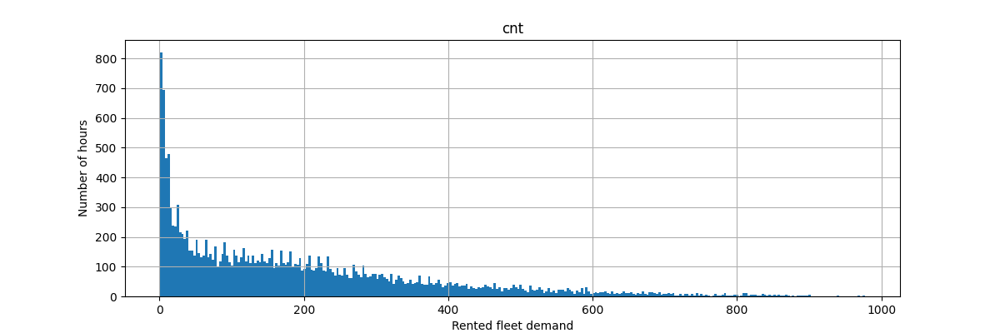

In [ ]:
# @title Histograma variável 'cnt'
fig, ax = plt.subplots(figsize=(12, 4))
y.hist(bins=300, ax=ax)
_ = ax.set(
    xlabel="Rented fleet demand",
    ylabel="Number of hours",
)

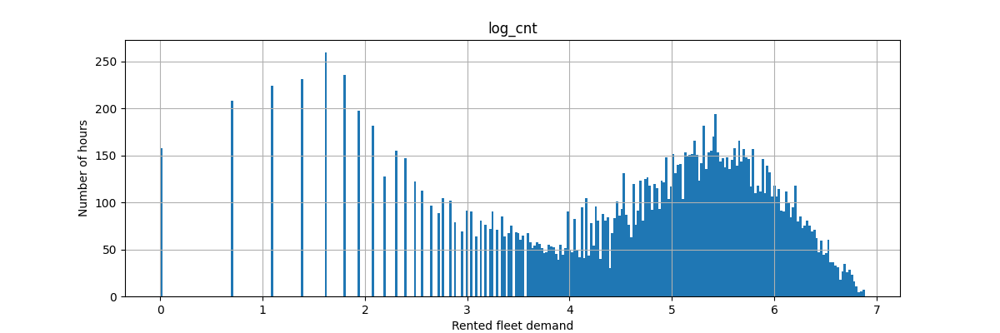

In [ ]:
# @title Histograma variável 'log_cnt'
fig, ax = plt.subplots(figsize=(12, 4))
log_y.hist(bins=300, ax=ax)
_ = ax.set(
    xlabel="Rented fleet demand",
    ylabel="Number of hours",
)

In [ ]:
#@title Data preparation categorical columns
df = X.copy()

#ajustando holiday
holiday = {'1': [1], '0': [0]}

for key, value in holiday.items():
    df['holiday'] = df['holiday'].mask(df['holiday'].isin(value), key)

#ajustando weathersit
weathersit = {'1': [1], '2': [2], '3': [3], '4': [4]}

for key, value in weathersit.items():
    df['weathersit'] = df['weathersit'].mask(df['weathersit'].isin(value), key)

#ajustando workingday
workingday = {'1': [1], '0': [0]}

for key, value in workingday.items():
    df['workingday'] = df['workingday'].mask(df['workingday'].isin(value), key)

#ajustando index_day
df['dteday'] = pd.to_datetime(df['dteday'])
df.insert(1, 'index_day', (df['dteday'] - df['dteday'].min()).dt.days)
df.drop(columns=['dteday'], inplace=True)

#inserindo lag-1h
df['lag-1h'] = log_y['log_cnt'].shift(1)

#inserindo diff-1h
df['diff-1h'] = log_y['log_cnt'].shift(1) - log_y['log_cnt'].shift(2)

#inserindo lag-24h
df['lag-24h'] = log_y['log_cnt'].shift(24)

#inserindo med-24h
df['med-24h'] = log_y['log_cnt'].shift(1).rolling(window=24).mean()

#inserindo std-24h
df['std-24h'] = log_y['log_cnt'].shift(1).rolling(window=24).std()
df = df.dropna()

#ajustando weekday
df.insert(3, 'cos_weekday',  np.cos(2 * np.pi * (df['weekday'])/(df['weekday'].max())))
df.insert(3, 'sin_weekday',  np.sin(2 * np.pi * (df['weekday'])/(df['weekday'].max())))
df.drop(columns=['weekday'], inplace=True)

#ajustando hr
df.insert(3, 'cos_hr', np.cos(2 * np.pi * (df['hr'])/(df['hr'].max())))
df.insert(3, 'sin_hr', np.sin(2 * np.pi * (df['hr'])/(df['hr'].max())))
df.drop(columns=['hr'], inplace=True)

#ajustando season e mnth
df.insert(3, 'cos_mnth', np.cos(2 * np.pi * (df['mnth'])/(df['mnth'].max())))
df.insert(3, 'sin_mnth', np.sin(2 * np.pi * (df['mnth'])/(df['mnth'].max())))
df.drop(columns=['season', 'mnth'], inplace=True)

In [ ]:
df_plot.head()

,holiday,cnt
24,0,17
25,0,17
26,0,9
27,0,6
28,0,3


In [ ]:
# @title Configuração do boxplot
df_plot = X['holiday'].copy().to_frame()

df_plot['turn'] = X['hr'].copy()
turn = {'graveyard': np.arange(0,6), 'morning': np.arange(6,12), 'afternoon': np.arange(12,18), 'evening': np.arange(18,24)}

for key, value in turn.items():
    df_plot['turn'] = df_plot['turn'].mask(df_plot['turn'].isin(value), key)

df_plot['cnt'] = y['cnt'].copy()

def plot_boxplot(df, col_feature, col_target):
    sns.set_style("whitegrid")
    plt.figure(figsize=(10, 6))

    # Criando o Boxplot
    ax = sns.boxplot(x=col_feature, y=col_target, data=df, palette="Set2", hue=col_feature, legend=False)

    # Melhorando a legibilidade dos eixos (opcional, assume 0=Dia Normal, 1=Feriado)
    # Se os dados já forem strings, remova as duas linhas abaixo
    labels = ['Dia Normal', 'Feriado']
    if set(df[col_feature].unique()).issubset({0, 1}):
        ax.set_xticklabels(labels)

    # Títulos e Labels
    plt.title(f'Distribuição de {col_target} por {col_feature}', fontsize=14)
    # plt.xlabel('Tipo de Dia', fontsize=12)
    plt.ylabel(col_target, fontsize=12)

    # # Exibir estatísticas básicas no gráfico (Medianas)
    # medians = df.groupby([col_feature])[col_target].median().values
    # vertical_offset = df[col_target].median() * 0.05 # offset de 5% da mediana

    # for xtick in ax.get_xticks():
    #     # Evita erro se o número de grupos for diferente
    #     if xtick < len(medians):
    #         ax.text(xtick, medians[xtick] + vertical_offset, f'{medians[xtick]:.1f}',
    #                 horizontalalignment='center', size='small', color='black', weight='semibold')

    plt.tight_layout()
    plt.show()

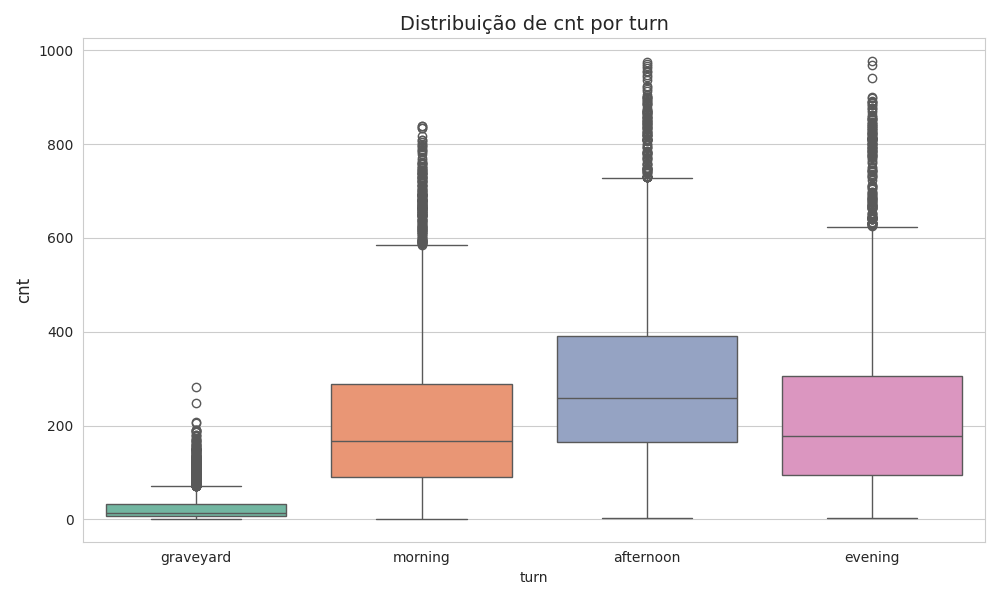

In [ ]:
plot_boxplot(df=df_plot, col_feature='turn', col_target='cnt')

/tmp/ipython-input-327587219.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels)


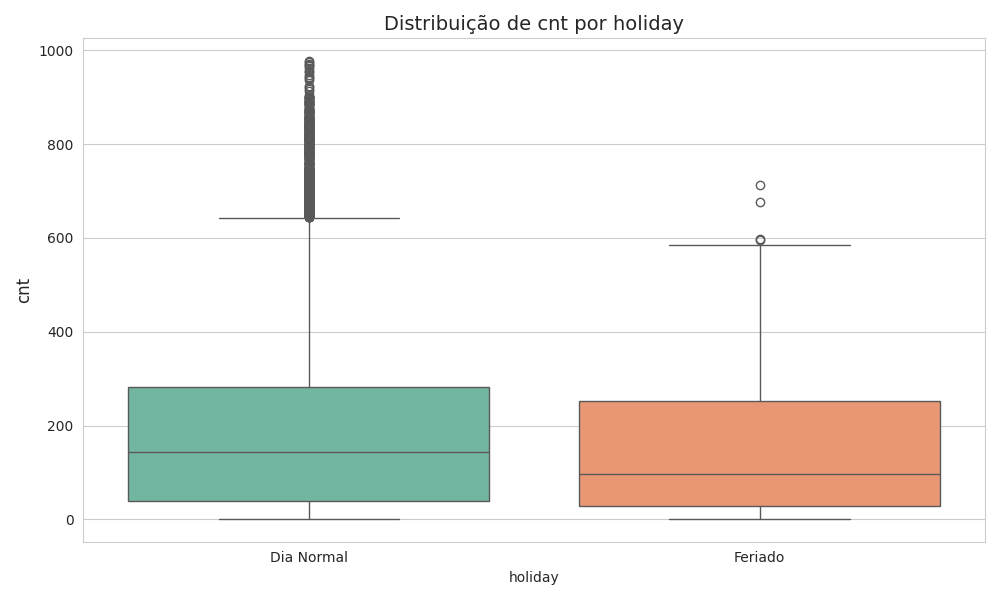

In [ ]:
plot_boxplot(df=df_plot, col_feature='holiday', col_target='cnt')

In [ ]:
df.head()

,index_day,yr,sin_mnth,cos_mnth,sin_hr,cos_hr,sin_weekday,cos_weekday,holiday,workingday,weathersit,temp,atemp,hum,windspeed,lag-1h,diff-1h,lag-24h,med-24h,std-24h
24,1,0,0.5,0.866025,0.000000,1.000000,0.0,1.0,0,0,2,0.46,0.4545,0.88,0.2985,3.663562,0.331357,2.772589,3.123272,1.408234
25,1,0,0.5,0.866025,0.269797,0.962917,0.0,1.0,0,0,2,0.44,0.4394,0.94,0.2537,2.833213,-0.830348,3.688879,3.125798,1.407631
26,1,0,0.5,0.866025,0.519584,0.854419,0.0,1.0,0,0,2,0.42,0.4242,1.00,0.2836,2.833213,0.000000,3.465736,3.090145,1.403580
27,1,0,0.5,0.866025,0.730836,0.682553,0.0,1.0,0,0,2,0.46,0.4545,0.94,0.1940,2.197225,-0.635989,2.564949,3.037290,1.412676
28,1,0,0.5,0.866025,0.887885,0.460065,0.0,1.0,0,0,2,0.46,0.4545,0.94,0.1940,1.791759,-0.405465,0.000000,3.005074,1.432592


In [ ]:
# @title EDA
df.describe(include='object')

,holiday,workingday,weathersit
count,17355,17355,17355
unique,2,2,4
top,0,1,1
freq,16855,11865,11401


In [ ]:
# @title EDA
df.describe()

,index_day,yr,sin_mnth,cos_mnth,sin_hr,cos_hr,sin_weekday,cos_weekday,temp,atemp,hum,windspeed,lag-1h,diff-1h,lag-24h,med-24h,std-24h
count,17355.000000,17355.000000,1.735500e+04,1.735500e+04,1.735500e+04,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000
mean,366.678997,0.503256,-6.232887e-03,-7.666229e-03,-4.634300e-03,0.038785,-0.001297,0.146125,0.497199,0.475930,0.626982,0.190139,4.538023,0.000045,4.536622,4.537256,1.406957
std,209.775140,0.500004,7.056721e-01,7.085103e-01,6.917690e-01,0.721102,0.653775,0.742483,0.192573,0.171897,0.192937,0.122322,1.485357,0.696299,1.486130,0.529286,0.176588
min,1.000000,0.000000,-1.000000e+00,-1.000000e+00,-9.976688e-01,-0.990686,-0.866025,-1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,-3.583519,0.000000,2.206528,0.647723
25%,185.000000,0.000000,-8.660254e-01,-8.660254e-01,-7.308360e-01,-0.775711,-0.866025,-0.500000,0.340000,0.333300,0.480000,0.104500,3.688879,-0.405465,3.688879,4.252566,1.288317
50%,367.000000,1.000000,-2.449294e-16,-1.836970e-16,-2.449294e-16,-0.068242,0.000000,0.500000,0.500000,0.484800,0.630000,0.194000,4.955827,-0.066691,4.955827,4.641946,1.413332
75%,548.000000,1.000000,5.000000e-01,5.000000e-01,6.310879e-01,0.854419,0.866025,1.000000,0.660000,0.621200,0.780000,0.253700,5.638355,0.334658,5.638355,4.934638,1.525116
max,730.000000,1.000000,1.000000e+00,1.000000e+00,9.976688e-01,1.000000,0.866025,1.000000,1.000000,1.000000,1.000000,0.850700,6.884487,3.688879,6.884487,5.528092,1.970133


In [ ]:
# @title One-hot Encoding
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

columns_to_drop = categorical_cols.copy()
columns_to_drop.remove('weathersit')

df_encoded = pd.get_dummies(df, columns=['weathersit'], drop_first=False, dtype=int)
df_encoded = pd.get_dummies(df_encoded, columns=columns_to_drop, drop_first=True, dtype=int)

df_encoded.describe()

,index_day,yr,sin_mnth,cos_mnth,sin_hr,cos_hr,sin_weekday,cos_weekday,temp,atemp,...,diff-1h,lag-24h,med-24h,std-24h,weathersit_1,weathersit_2,weathersit_3,weathersit_4,holiday_1,workingday_1
count,17355.000000,17355.000000,1.735500e+04,1.735500e+04,1.735500e+04,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,...,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000
mean,366.678997,0.503256,-6.232887e-03,-7.666229e-03,-4.634300e-03,0.038785,-0.001297,0.146125,0.497199,0.475930,...,0.000045,4.536622,4.537256,1.406957,0.656929,0.261250,0.081648,0.000173,0.028810,0.683665
std,209.775140,0.500004,7.056721e-01,7.085103e-01,6.917690e-01,0.721102,0.653775,0.742483,0.192573,0.171897,...,0.696299,1.486130,0.529286,0.176588,0.474749,0.439329,0.273835,0.013147,0.167277,0.465059
min,1.000000,0.000000,-1.000000e+00,-1.000000e+00,-9.976688e-01,-0.990686,-0.866025,-1.000000,0.020000,0.000000,...,-3.583519,0.000000,2.206528,0.647723,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,185.000000,0.000000,-8.660254e-01,-8.660254e-01,-7.308360e-01,-0.775711,-0.866025,-0.500000,0.340000,0.333300,...,-0.405465,3.688879,4.252566,1.288317,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,367.000000,1.000000,-2.449294e-16,-1.836970e-16,-2.449294e-16,-0.068242,0.000000,0.500000,0.500000,0.484800,...,-0.066691,4.955827,4.641946,1.413332,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,548.000000,1.000000,5.000000e-01,5.000000e-01,6.310879e-01,0.854419,0.866025,1.000000,0.660000,0.621200,...,0.334658,5.638355,4.934638,1.525116,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000
max,730.000000,1.000000,1.000000e+00,1.000000e+00,9.976688e-01,1.000000,0.866025,1.000000,1.000000,1.000000,...,3.688879,6.884487,5.528092,1.970133,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
df_encoded.columns.tolist()

['index_day',
 'yr',
 'sin_mnth',
 'cos_mnth',
 'sin_hr',
 'cos_hr',
 'sin_weekday',
 'cos_weekday',
 'temp',
 'atemp',
 'hum',
 'windspeed',
 'lag-1h',
 'diff-1h',
 'lag-24h',
 'med-24h',
 'std-24h',
 'weathersit_1',
 'weathersit_2',
 'weathersit_3',
 'weathersit_4',
 'holiday_1',
 'workingday_1']

In [ ]:
#@title EDA
numerical_cols_encoded = df_encoded.select_dtypes(exclude=['bool', 'object', 'category']).columns.tolist()
categorical_cols_encoded = df_encoded.select_dtypes(include=['bool', 'object', 'category']).columns.tolist()
continuous_cols_encoded = df_encoded.select_dtypes(include=['float']).columns.tolist()

In [ ]:
df_encoded.describe()

,index_day,yr,sin_mnth,cos_mnth,sin_hr,cos_hr,sin_weekday,cos_weekday,temp,atemp,...,diff-1h,lag-24h,med-24h,std-24h,weathersit_1,weathersit_2,weathersit_3,weathersit_4,holiday_1,workingday_1
count,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,1.735500e+04,17355.000000,17355.000000,17355.000000,17355.000000,...,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000
mean,366.678997,0.503256,-0.005548,-0.091741,-0.004515,-3.350514e-03,-0.002215,0.002502,0.497199,0.475930,...,0.000045,4.536622,4.537256,1.406957,0.656929,0.261250,0.081648,0.000173,0.028810,0.683665
std,209.775140,0.500004,0.734781,0.672092,0.706813,7.074186e-01,0.706518,0.707728,0.192573,0.171897,...,0.696299,1.486130,0.529286,0.176588,0.474749,0.439329,0.273835,0.013147,0.167277,0.465059
min,1.000000,0.000000,-0.992709,-0.970942,-1.000000,-1.000000e+00,-0.974928,-0.900969,0.020000,0.000000,...,-3.583519,0.000000,2.206528,0.647723,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,185.000000,0.000000,-0.663123,-0.748511,-0.707107,-7.071068e-01,-0.781831,-0.900969,0.340000,0.333300,...,-0.405465,3.688879,4.252566,1.288317,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,367.000000,1.000000,-0.239316,-0.354605,0.000000,-1.836970e-16,0.000000,-0.222521,0.500000,0.484800,...,-0.066691,4.955827,4.641946,1.413332,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,548.000000,1.000000,0.663123,0.568065,0.707107,7.071068e-01,0.781831,0.623490,0.660000,0.621200,...,0.334658,5.638355,4.934638,1.525116,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000
max,730.000000,1.000000,0.992709,0.885456,1.000000,1.000000e+00,0.974928,1.000000,1.000000,1.000000,...,3.688879,6.884487,5.528092,1.970133,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
# @title EDA
df_encoded.describe(include='float')

,sin_mnth,cos_mnth,sin_hr,cos_hr,sin_weekday,cos_weekday,temp,atemp,hum,windspeed,lag-1h,diff-1h,lag-24h,med-24h,std-24h
count,17355.000000,17355.000000,17355.000000,1.735500e+04,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000,17355.000000
mean,-0.005548,-0.091741,-0.004515,-3.350514e-03,-0.002215,0.002502,0.497199,0.475930,0.626982,0.190139,4.538023,0.000045,4.536622,4.537256,1.406957
std,0.734781,0.672092,0.706813,7.074186e-01,0.706518,0.707728,0.192573,0.171897,0.192937,0.122322,1.485357,0.696299,1.486130,0.529286,0.176588
min,-0.992709,-0.970942,-1.000000,-1.000000e+00,-0.974928,-0.900969,0.020000,0.000000,0.000000,0.000000,0.000000,-3.583519,0.000000,2.206528,0.647723
25%,-0.663123,-0.748511,-0.707107,-7.071068e-01,-0.781831,-0.900969,0.340000,0.333300,0.480000,0.104500,3.688879,-0.405465,3.688879,4.252566,1.288317
50%,-0.239316,-0.354605,0.000000,-1.836970e-16,0.000000,-0.222521,0.500000,0.484800,0.630000,0.194000,4.955827,-0.066691,4.955827,4.641946,1.413332
75%,0.663123,0.568065,0.707107,7.071068e-01,0.781831,0.623490,0.660000,0.621200,0.780000,0.253700,5.638355,0.334658,5.638355,4.934638,1.525116
max,0.992709,0.885456,1.000000,1.000000e+00,0.974928,1.000000,1.000000,1.000000,1.000000,0.850700,6.884487,3.688879,6.884487,5.528092,1.970133


In [ ]:
# @title Divisão do dataset
log_y = log_y.loc[df.index]

X_train, X_test, y_train, y_test = train_test_split(df_encoded, log_y, test_size=0.2, shuffle=False)

In [ ]:
 # @title Implementando RMSE e NLPD
def RMSE(y_true, y_pred):
  return np.sqrt(np.mean((y_true - y_pred)**2))

def MRE(y_true, y_pred):
  return np.mean(np.abs((y_true - y_pred)/y_true))

def NLPD(y_true, mean_pred, var_pred): # ajustar
  return 0.5*(np.log(2*np.pi) + np.mean(np.log(var_pred + 1e-6) + (y_true - mean_pred)**2/(var_pred + 1e-6)))

In [ ]:
# @title Implementando a Regressão Bayesiana (Linear e Polinomial)
class BayesianRegression():
    def __init__(self, degree=1, cols_to_transform=None, n_calls = 50):
        """
        degree: grau do polinômio a ser utilizado
        cols_to_transform: lista de colunas a serem transformadas
        """
        self.degree = degree
        self.cols_to_transform = cols_to_transform
        self.n_calls = n_calls
        self.prior_prec = None
        self.noise_var = None

    def set_prior(self, input_dims, prior_std=1e2, noise_std=1e-1):
        self.prior_std = prior_std
        self.noise_std = noise_std
        self.prior_prec = (1/prior_std**2)*np.eye(input_dims)
        self.noise_var = (noise_std**2)

    def pol_transform(self, X, degree=1):
        if self.cols_to_transform is None:
            X_to_transform = X.to_numpy() if isinstance(X, pd.DataFrame) else X
            X_to_maintain = np.array([]).reshape(X_to_transform.shape[0], 0)
        else:
            if not isinstance(self.cols_to_transform, list):
                raise KeyError("'cols_to_transform' must be an instance of the list class.")
            if isinstance(X, pd.DataFrame):
                try:
                    X_to_transform_df = X[self.cols_to_transform].copy()
                    X_to_maintain_df = X.drop(columns=self.cols_to_transform)
                    X_to_transform = X_to_transform_df.to_numpy()
                    X_to_maintain = X_to_maintain_df.to_numpy()
                except KeyError as e:
                    raise KeyError(f"Column(s) not found in DataFrame: {e}")
            elif isinstance(X, np.ndarray):
                try:
                    X_to_transform = X[:, self.cols_to_transform].copy()
                    X_to_maintain = np.delete(X, self.cols_to_transform, axis=1)
                except Exception as e:
                    raise Exception(f"Error processing numpy array: {e}")
            else:
                raise TypeError("X must be a pandas DataFrame or a numpy array.")

        X_poly = X_to_transform.copy()
        for i in range(1, degree):
            X_poly = np.hstack((X_poly, X_to_transform**(i+1)))

        X_transf_base = np.hstack((np.ones((X_to_transform.shape[0], 1)), X_poly))

        if X_to_maintain.size > 0:
            X_transf = np.hstack((X_transf_base, X_to_maintain))
        else:
            X_transf = X_transf_base
        return X_transf

    def train(self, X, y):
        self.X = X

        if isinstance(y, pd.DataFrame):
            y = y.to_numpy()
        self.y_train = y

        # Definindo o espaço de busca
        space = [Real(1e-1, 1e2, name='prior_std', prior='log-uniform')]

        # Ruído de observação
        space.append(Real(1e-3, 1e1, name='noise_std', prior='log-uniform'))

        # Grau do polinômio
        if self.degree == None:
            space.append(Integer(2, 15, name='degree', prior='uniform'))

        # Função objetivo
        @use_named_args(space)
        def objective(**params):
            self.prior_std = params['prior_std']
            self.noise_std = params['noise_std']

            if self.degree == None:
                self.best_degree = params['degree']
                self.X_transf = self.pol_transform(self.X, self.best_degree)
            else:
                self.X_transf = self.pol_transform(self.X, self.degree)
            self.D = self.X_transf.shape[1]
            return - self.evidence()

        # Otimização Bayesiana
        theta_opt = gp_minimize(
                          objective,
                          space,
                          acq_func="EI",    # Expected Improvement
                          n_calls=self.n_calls,
                          n_random_starts=int(0.2*self.n_calls),
                          random_state=12345
                        )
        self.opt_result = theta_opt

        # Parâmetros otimizados
        self.theta_opt = theta_opt.x
        self.prior_std = self.theta_opt[0]
        self.noise_std = self.theta_opt[1]

        if self.degree == None:
            self.degree = self.theta_opt[2]

        if self.prior_prec is None or self.prior_prec.shape[0] != self.X_transf.shape[1]:
            self.set_prior(input_dims=self.X_transf.shape[1])

        self.X_transf = self.pol_transform(self.X, self.degree)
        self.D = self.X_transf.shape[1]

        self.noise_var = (self.noise_std**2)
        beta = 1/(self.noise_var)
        self.prior_prec = (1/self.prior_std**2)*np.eye(self.D)
        self.post_prec = self.prior_prec + beta * (self.X_transf.T @ self.X_transf)

        self.w_cov = np.linalg.pinv(self.post_prec)
        self.w_mean = beta * (self.w_cov @ self.X_transf.T @ self.y_train)

    def predict(self, X):
        self.X_test = X
        self.X_poly_test = self.pol_transform(self.X_test, self.degree)
        self.mean_pred = self.X_poly_test @ self.w_mean

        self.var_pred = np.clip(np.diag(self.X_poly_test @ self.w_cov @ self.X_poly_test.T) + self.noise_var, self.noise_var, None)
        self.std_pred = np.sqrt(self.var_pred)

        self.eps_uncert = np.sqrt(np.clip(np.diag(self.X_poly_test @ self.w_cov @ self.X_poly_test.T), 1e-6, None))
        return self.mean_pred, self.var_pred.reshape(-1,1)

    def evidence(self):
        N, M = self.X_transf.shape
        alpha_prec = 1/(self.prior_std**2)
        self.noise_var = (self.noise_std**2)
        beta = 1/(self.noise_var)

        self.prior_prec = (1/self.prior_std**2)*np.eye(self.D)
        self.post_prec = self.prior_prec + beta * (self.X_transf.T @ self.X_transf)
        sign, logdet_prec = np.linalg.slogdet(self.post_prec)

        self.w_cov = np.linalg.pinv(self.post_prec)
        self.w_mean = beta * (self.w_cov @ self.X_transf.T @ self.y_train)

        residuals = self.y_train - (self.X_transf @ self.w_mean)
        data_error = 0.5 * beta * np.sum(residuals**2)
        weight_penalty = 0.5 * alpha_prec * np.sum(self.w_mean**2)

        evidence = (0.5 * M * np.log(alpha_prec)) + \
                   (0.5 * N * np.log(beta)) - \
                   (data_error + weight_penalty) - \
                   (0.5 * logdet_prec) - \
                   (0.5 * N * np.log(2 * np.pi))
        return evidence

    def evaluate(self, x_test, y_test, scaler=None):
        mean_pred, var_pred = self.predict(x_test)

        if scaler is not None:
            std_scaler = scaler.scale_

            y_test_unscaled = scaler.inverse_transform(y_test)
            mean_pred_unscaled = scaler.inverse_transform(mean_pred)
            var_pred_unscaled = var_pred * (std_scaler ** 2)
        else:
            y_test_unscaled = y_test
            mean_pred_unscaled = mean_pred
            var_pred_unscaled = var_pred

        y_true = np.exp(y_test_unscaled)
        y_pred = np.exp(mean_pred_unscaled + var_pred_unscaled/2)

        rmse = RMSE(y_true, y_pred)
        mre = MRE(y_true, y_pred)
        nlpd = NLPD(y_test_unscaled, mean_pred_unscaled, var_pred_unscaled.reshape(-1,1))
        print(f"\nRMSE = {rmse:.2e}; MRE = {mre:.2e}; NLPD = {nlpd:.2e}\n")
        return rmse, mre, nlpd

    def plot_predict(self, y_test):
        def on_select(eclick, erelease):
            x1, y1 = eclick.xdata, eclick.ydata
            x2, y2 = erelease.xdata, erelease.ydata

            # Zoom interativo
            ax = eclick.inaxes
            if ax:
                xmin, xmax = min(x1, x2), max(x1, x2)
                ymin, ymax = min(y1, y2), max(y1, y2)
                ax.set_xlim(xmin, xmax)
                ax.set_ylim(ymin, ymax)
                plt.draw()

        n_train = self.X.shape[0]
        n_test = y_test.shape[0]

        xx = self.X_test
        yy = y_test

        mean_pred, var_pred = self.predict(xx)
        std_pred = np.sqrt(var_pred)

        fig, ax = plt.subplots(figsize=[12,6])
        ax.scatter(range(n_test), y_test, alpha=0.3)
        ax.plot(range(xx.shape[0]), yy)
        ax.plot(range(xx.shape[0]), mean_pred)
        ax.fill_between(
            range(xx.shape[0]),
            (mean_pred - 2 * std_pred).ravel(),
            (mean_pred + 2 * std_pred).ravel(),
            alpha=0.3,
            label=r"95% confidence interval"
        )

        ax.set_title(f"Posterior predictions ({self.__class__.__name__}; degree = {self.degree})")
        ax.legend(["Test data", "Real value (log_cnt)", "Predicted Mean (log_cnt)", "Confidence"],
                  loc='lower right')
        ax.set_xlabel("t")
        ax.set_ylabel("log_cnt")
        self.selector = RectangleSelector(ax, on_select,
                                       useblit=True,
                                       button=[1],
                                       minspanx=5, minspany=5,
                                       spancoords='pixels',
                                       interactive=True)
        plt.tight_layout()
        plt.show()

    def best_params(self):
        print(f"\nMelhor grau do polinômio: {self.degree}")
        print(f"Melhor prior_std: {self.prior_std}")
        print(f"Melhor noise_std: {self.noise_std}\n")
        return [self.degree, self.prior_std, self.noise_std]

    def plot_optimization_convergence(self):
        """
        Plota a evolução do valor da função objetivo (Negative Log Marginal Likelihood)
        ao longo das iterações da otimização bayesiana.
        """
        if self.opt_result is None:
            print("O modelo precisa ser treinado antes de plotar a convergência.")
            return

        fig_conv, ax_conv = plt.subplots(figsize=(10, 6))
        plot_convergence(self.opt_result, ax=ax_conv)
        ax_conv.set_title("Convergência da Otimização de Hiperparâmetros (Neg Evidence)")
        ax_conv.set_ylabel("Negative Log Marginal Likelihood")
        ax_conv.set_xlabel("Número de Chamadas (n_calls)")
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.show()

In [ ]:
# @title Implementando a classe GP_regressor com otimização bayesiana
class GP_Regressor_Bayesian_Opt():
    def __init__(self, n_calls=50, kernel='rbf'):
        self.theta_opt = None
        self.L = None
        self.alpha = None
        self.n_calls= n_calls
        self.kernel = kernel

    def rbf_function(self, x_i, x_j, w, sigma_f):
        return sigma_f * np.exp(-0.5*np.sum(w * (x_i - x_j)**2))

    def rbf_kernel(self, X1, w, sigma_f, X2=None):
        if X2 is None:
            X2 = X1

        X1_scaled = X1 * np.sqrt(w)
        X2_scaled = X2 * np.sqrt(w)
        dist_sq = cdist(X1_scaled, X2_scaled, 'sqeuclidean')
        K = sigma_f * np.exp(-0.5 * dist_sq)
        return K

    def linear_kernel(self, X1, X2):
        return X1 @ X2.T

    def mattern32_kernel(self, X1, w, sigma_f, X2=None):
        if X2 is None:
            X2 = X1
        X1_scaled = X1 * np.sqrt(w)
        X2_scaled = X2 * np.sqrt(w)
        dist_sq = cdist(X1_scaled, X2_scaled, 'sqeuclidean')
        return sigma_f * (1 + np.sqrt(3)) * np.exp(-np.sqrt(3) * np.sqrt(dist_sq))

    def compound_kernel(self, X1, w, sigma_f, X2=None, kernel='rbf'):
        if X2 is None:
            X2 = X1
        if kernel == 'mattern_32':
            self.kernel_function = self.mattern32_kernel(X1, w, sigma_f, X2)
        elif kernel == 'rbf':
            self.kernel_function = self.rbf_kernel(X1, w, sigma_f, X2)
        else:
            print("Favor inserir opção de kernel válida ('rbf' ou 'mattern_32')")
            return None
        return self.linear_kernel(X1, X2) + self.kernel_function

    def neg_evidence(self, theta, X, y):
        if isinstance(X, pd.DataFrame):
            X = X.to_numpy()
        if isinstance(y, pd.DataFrame):
            y = y.to_numpy()
        N, D = X.shape
        sigma_f = theta[0]
        w = np.array(theta[1:-1])
        sigma_y = theta[-1]

        K = self.compound_kernel(X, w, sigma_f, kernel=self.kernel)
        K_noisy = K + (sigma_y + 1e-6) * np.eye(N)

        try:
            L = np.linalg.cholesky(K_noisy)
        except Exception as e:
            return 1e42

        alpha = np.linalg.solve(L.T, np.linalg.solve(L, y)) #alpha = K^(-1)y

        neg_evidence = np.sum(np.log(np.diag(L))) +  \
                       0.5*((y.T @ alpha).item() + N*np.log(2*np.pi))

        return neg_evidence

    def train(self, X, y, random_state=12345):
        if isinstance(X, pd.DataFrame):
            X = X.to_numpy()
        if isinstance(y, pd.DataFrame):
            y = y.to_numpy()
        self.x_train = X
        self.y_train = y
        self.N, self.D = X.shape

        # Definindo o espaço de busca
        space = [Real(1e-3, 1e2, name='sigma_f', prior='log-uniform')]

        for i in range(self.D):
            space.append(Real(1e-2, 1e2, name=f'w_{i}', prior='log-uniform'))

        # Ruído de observação
        space.append(Real(1e-3, 1.0, name='sigma_y', prior='log-uniform'))

        # Função objetivo
        @use_named_args(space)
        def objective(**params):
            s_f = params['sigma_f']
            s_y = params['sigma_y']

            w_vals = [params[f'w_{i}'] for i in range(self.D)]

            theta = [s_f] + w_vals + [s_y]
            return self.neg_evidence(theta, self.x_train, self.y_train)

        # Otimização Bayesiana
        theta_opt = gp_minimize(
                          objective,
                          space,
                          acq_func="EI",    # Expected Improvement
                          n_calls=self.n_calls,
                          n_random_starts=int(0.2*self.n_calls),
                          random_state=random_state
                        )

        self.opt_result = theta_opt

        # Parâmetros otimizados
        self.theta_opt = theta_opt.x
        self.sigma_f = self.theta_opt[0]
        self.w = np.array(self.theta_opt[1:-1])
        self.sigma_y = self.theta_opt[-1]

        # Recalculando as matrizes
        self.K = self.compound_kernel(self.x_train, self.w, self.sigma_f)
        K_noisy = self.K + (self.sigma_y + 1e-6) * np.eye(self.N)
        self.L = np.linalg.cholesky(K_noisy)
        self.alpha = np.linalg.solve(self.L.T, np.linalg.solve(self.L, self.y_train)) #alpha = K^(-1)y

    def predict(self, X):
        if isinstance(X, pd.DataFrame):
            X = X.to_numpy()
        self.x_test = X
        self.N_test = self.x_test.shape[0]

        K_star = self.compound_kernel(self.x_train, self.w, self.sigma_f, self.x_test, kernel=self.kernel)

        diag_K_star_star = (self.sigma_f) * np.ones(self.N_test) + np.sum(self.x_test**2, axis=1)

        mean_pred = K_star.T @ self.alpha

        v = np.linalg.solve(self.L, K_star)   # v = L^(-1) @ K_star
        diag_vTv = np.sum(v**2, axis=0)
        diag_cov_pred = diag_K_star_star - diag_vTv + self.sigma_y
        var_pred = np.clip(diag_cov_pred, 1e-6, None)
        return mean_pred, var_pred.reshape(-1,1)

    def evaluate(self, x_test, y_test, scaler=None):
        mean_pred, var_pred = self.predict(x_test)

        if scaler is not None:
            std_scaler = scaler.scale_

            y_test_unscaled = scaler.inverse_transform(y_test)
            mean_pred_unscaled = scaler.inverse_transform(mean_pred)
            var_pred_unscaled = var_pred * (std_scaler ** 2)
        else:
            y_test_unscaled = y_test
            mean_pred_unscaled = mean_pred
            var_pred_unscaled = var_pred

        y_true = np.exp(y_test_unscaled)
        y_pred = np.exp(mean_pred_unscaled + var_pred_unscaled/2)

        rmse = RMSE(y_true, y_pred)
        mre = MRE(y_true, y_pred)
        nlpd = NLPD(y_test_unscaled, mean_pred_unscaled, var_pred_unscaled.reshape(-1,1))
        print(f"\nRMSE = {rmse:.2e}; MRE = {mre:.2e}; NLPD = {nlpd:.2e}\n")
        return rmse, mre, nlpd

    def plot_predict(self, y_test):
        def local_select_callback(eclick, erelease):
            x1, y1 = eclick.xdata, eclick.ydata
            x2, y2 = erelease.xdata, erelease.ydata

            # Zoom interativo
            ax = eclick.inaxes
            if ax:
                xmin, xmax = min(x1, x2), max(x1, x2)
                ymin, ymax = min(y1, y2), max(y1, y2)
                ax.set_xlim(xmin, xmax)
                ax.set_ylim(ymin, ymax)
                plt.draw()

        n_train = self.x_train.shape[0]
        n_test = y_test.shape[0]

        xx = self.x_test
        yy = y_test

        mean_pred, var_pred = self.predict(xx)
        std_pred = np.sqrt(var_pred)

        fig, ax = plt.subplots(figsize=[12,6])
        ax.scatter(range(n_test), y_test, alpha=0.3)
        ax.plot(range(xx.shape[0]), yy)
        ax.plot(range(xx.shape[0]), mean_pred)
        ax.fill_between(
            range(xx.shape[0]),
            (mean_pred - 2 * std_pred).ravel(),
            (mean_pred + 2 * std_pred).ravel(),
            alpha=0.3,
            label=r"95% confidence interval"
        )

        ax.set_title(f"Posterior predictions ({self.__class__.__name__})")
        ax.legend(["Test data", "Real value (log_cnt)", "Predicted Mean (log_cnt)", "Confidence"],
                  loc='lower right')
        ax.set_xlabel("t")
        ax.set_ylabel("log_cnt")
        self.selector = RectangleSelector(ax, local_select_callback,
                                       useblit=True,
                                       button=[1],
                                       minspanx=5, minspany=5,
                                       spancoords='pixels',
                                       interactive=True)
        plt.connect('key_press_event', self.selector)
        plt.tight_layout()
        plt.show()

    def best_params(self):
        print(f"\nMelhor sigma_f: {self.sigma_f}")
        print(f"Melhor w: {self.w}")
        print(f"Melhor sigma_y: {self.sigma_y}\n")
        return self.theta_opt

    def plot_optimization_convergence(self):
        """
        Plota a evolução do valor da função objetivo (Negative Log Marginal Likelihood)
        ao longo das iterações da otimização bayesiana.
        """
        if self.opt_result is None:
            print("O modelo precisa ser treinado antes de plotar a convergência.")
            return

        fig_conv, ax_conv = plt.subplots(figsize=(10, 6))
        plot_convergence(self.opt_result, ax=ax_conv)
        ax_conv.set_title("Convergência da Otimização de Hiperparâmetros (Neg Evidence)")
        ax_conv.set_ylabel("Negative Log Marginal Likelihood")
        ax_conv.set_xlabel("Número de Chamadas (n_calls)")
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.show()

In [ ]:
# @title Implementando pipeline
def run_pipeline(X_train, X_test, y_train, y_test, best_degree=None, cols_to_transform=None, n_calls=50, plot=False, kernel='rbf'):
    resultados = {}

    cols_to_transform_indices = None
    if cols_to_transform is not None and isinstance(X_train, pd.DataFrame):
        original_cols = X_train.columns.tolist()
        cols_to_transform_indices = [original_cols.index(col) for col in cols_to_transform]

    modelos = {
        'BayesianLinearRegression': BayesianRegression(degree=1, cols_to_transform=None),
        'GP': GP_Regressor_Bayesian_Opt(n_calls=n_calls, kernel=kernel)
    }

    if cols_to_transform_indices is not None:
        modelos['BayesianPolynomialRegression'] = BayesianRegression(degree=best_degree, cols_to_transform=cols_to_transform_indices)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    y_scaler = StandardScaler()

    y_train_scaled = y_scaler.fit_transform(y_train)
    y_test_scaled = y_scaler.transform(y_test)

    for nome, modelo in modelos.items():
        print(f"\nTreinando o modelo {nome}...")

        start_train = time.time()
        modelo.train(X_train_scaled, y_train_scaled)
        end_train = time.time()

        print("\nMelhores hiperparâmetros encontrados para o modelo:")
        best_params = modelo.best_params()

        if nome == 'GP':
            index = np.argsort(best_params[1:-1])
            features = np.array(X_train.columns.to_list())
            print(f"Ordem de relevância dos atributos (ARD): {features[index[::-1]]}")

        print(f"\nValores de RMSE e NLPD para o conjunto de treino:")
        rmse_train, mre_train, nlpd_train = modelo.evaluate(X_train_scaled, y_train_scaled, scaler=y_scaler)

        print(f"\nValores de RMSE e NLPD para o conjunto de teste:")
        start_test = time.time()
        rmse_test, mre_test, nlpd_test = modelo.evaluate(X_test_scaled, y_test_scaled, scaler=y_scaler)
        end_test = time.time()

        resultados[nome] = {
            'rmse': rmse_test,
            'mre': mre_test,
            'nlpd': nlpd_test,
            'train_time': end_train - start_train,
            'test_time': end_test - start_test
        }

        print(f"Tempo de treino: {end_train - start_train} s\n")
        print(f"Tempo de teste: {end_test - start_test} s\n")

        if plot:
            modelo.plot_predict(y_test_scaled)
        modelo.plot_optimization_convergence()
    return resultados

Bike Sharing Results

Treinando o modelo BayesianLinearRegression...

Melhores hiperparâmetros encontrados para o modelo:

Melhor grau do polinômio: 1
Melhor prior_std: 26.415943898717657
Melhor noise_std: 0.32238684191493966


Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 3.53e-01; MRE = 2.69e-01; NLPD = 3.15e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 4.30e-01; MRE = 2.30e-01; NLPD = 3.26e-01

Tempo de treino: 37.323373317718506 s

Tempo de teste: 0.0006659030914306641 s



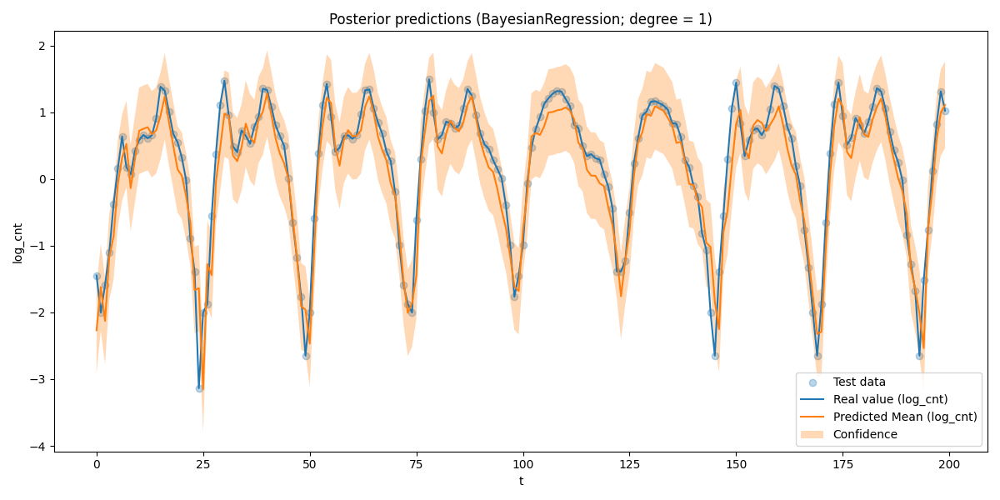

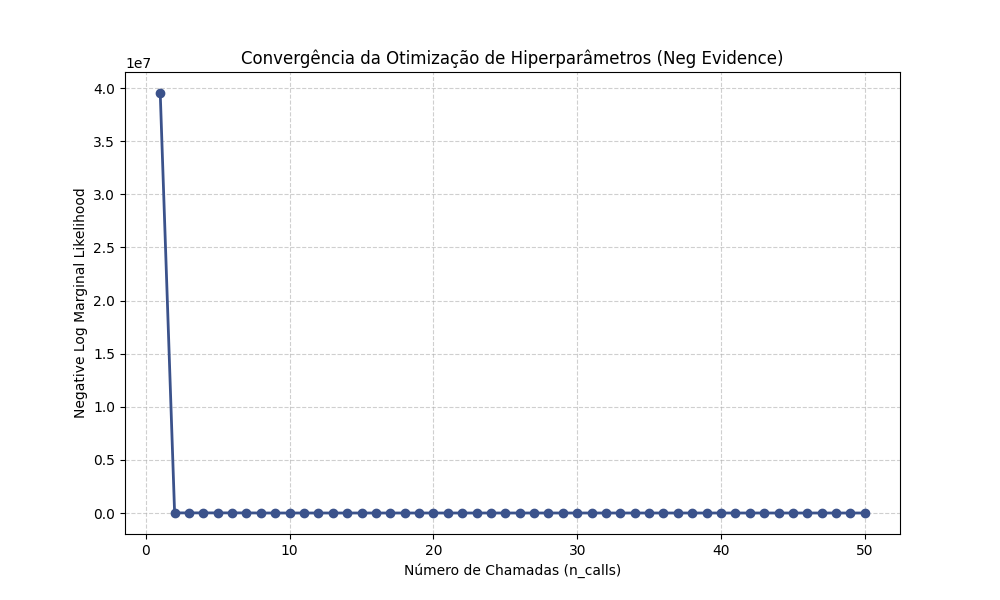


Treinando o modelo GP...

Melhores hiperparâmetros encontrados para o modelo:

Melhor sigma_f: 0.026780272798627408
Melhor w: [1.e-02 1.e-02 1.e-02 1.e+02 1.e-02 1.e+02 1.e-02 1.e+02 1.e+02 1.e+02
 1.e-02 1.e-02 1.e+02 1.e-02 1.e-02 1.e-02 1.e-02 1.e-02 1.e+02 1.e-02
 1.e-02 1.e-02 1.e-02]
Melhor sigma_y: 0.03613443910294096

Ordem de relevância dos atributos (ARD): ['weathersit_2' 'cos_mnth' 'cos_hr' 'cos_weekday' 'atemp' 'temp' 'lag-1h'
 'std-24h' 'weathersit_1' 'weathersit_3' 'weathersit_4' 'workingday_1'
 'holiday_1' 'diff-1h' 'med-24h' 'windspeed' 'hum' 'lag-24h' 'sin_weekday'
 'sin_hr' 'sin_mnth' 'yr' 'index_day']

Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 6.43e-02; MRE = 3.86e-02; NLPD = 7.58e+02


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 4.53e-01; MRE = 2.33e-01; NLPD = 4.30e-01

Tempo de treino: 2016.1363291740417 s

Tempo de teste: 14.215972185134888 s



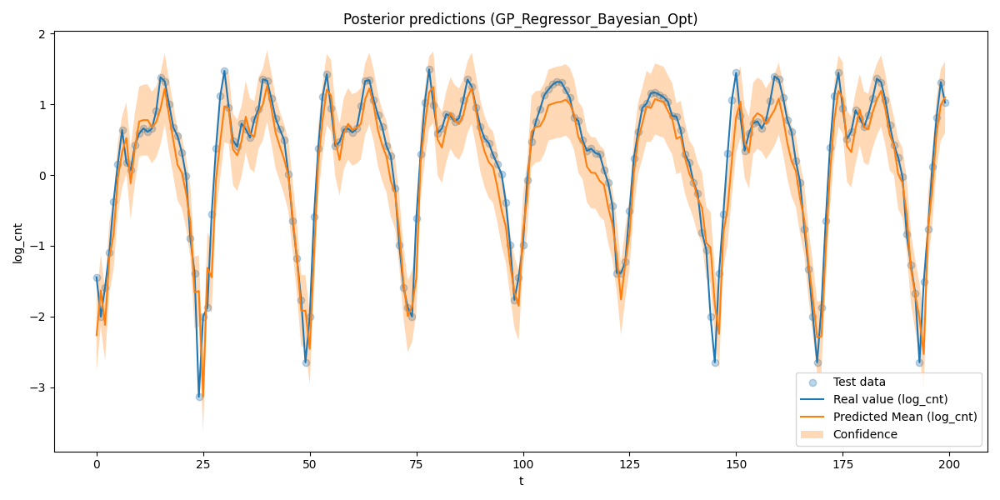

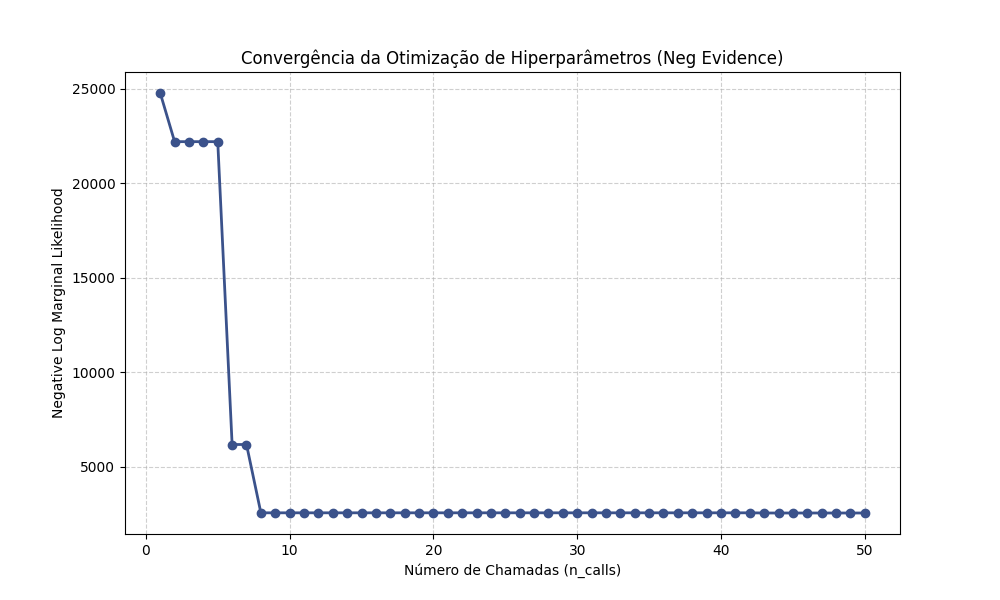


Treinando o modelo BayesianPolynomialRegression...

Melhores hiperparâmetros encontrados para o modelo:

Melhor grau do polinômio: 7
Melhor prior_std: 16.27821530572362
Melhor noise_std: 0.24382518282566745


Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 2.82e-01; MRE = 2.11e-01; NLPD = 1.19e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 3.31e-01; MRE = 1.68e-01; NLPD = 4.52e-02

Tempo de treino: 34.2286913394928 s

Tempo de teste: 0.002460956573486328 s



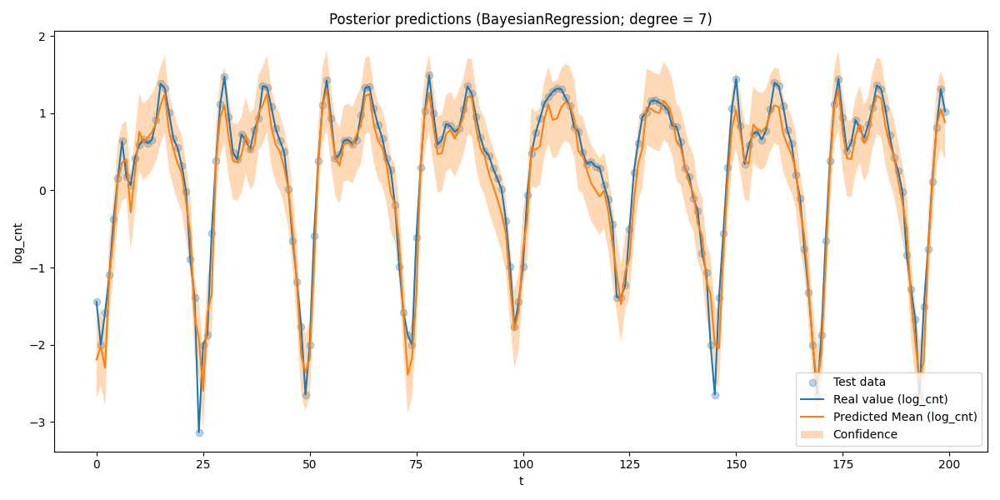

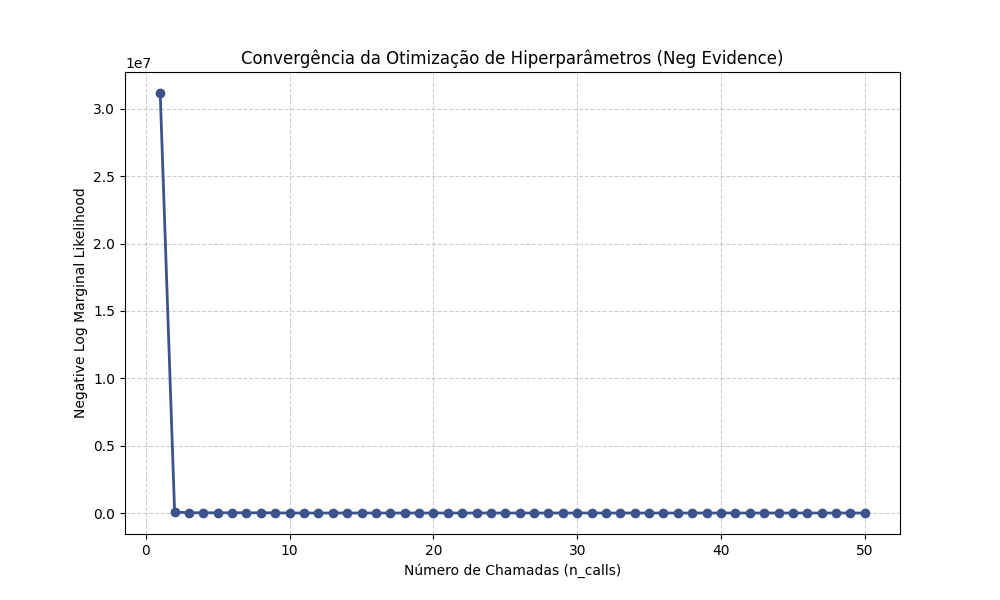

In [ ]:
# @title Testes mattern (8000 dados de treino, 200 dados de teste)
print("Bike Sharing Results")
bike_sharing_df = run_pipeline(X_train[2000:10000], X_test[2300:2500], y_train[2000:10000], y_test[2300:2500], n_calls=50, cols_to_transform=continuous_cols_encoded, plot=True, kernel='mattern_32')

Bike Sharing Results (yearly training)

Treinando o modelo BayesianLinearRegression...

Melhores hiperparâmetros encontrados para o modelo:

Melhor grau do polinômio: 1
Melhor prior_std: 26.415943898717657
Melhor noise_std: 0.32238684191493966


Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 3.59e-01; MRE = 2.74e-01; NLPD = 3.26e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 5.51e+151; MRE = 3.83e+151; NLPD = 4.17e+00

Tempo de treino: 23.683027029037476 s

Tempo de teste: 0.000637054443359375 s



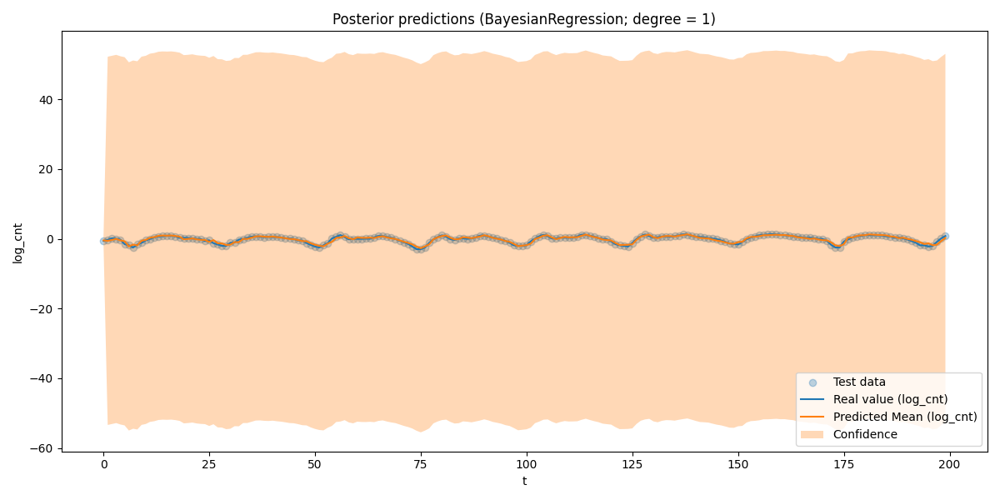

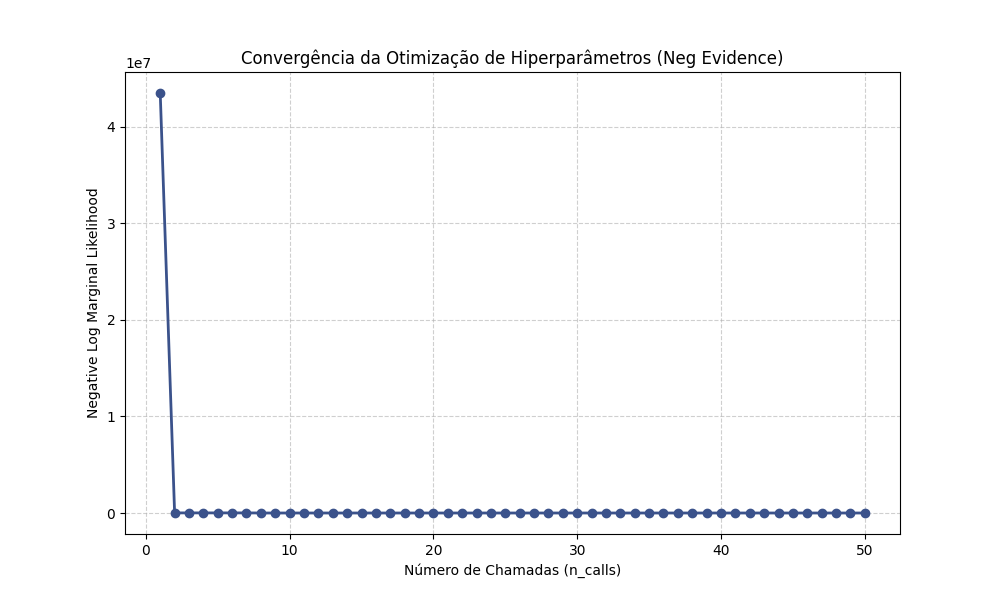


Treinando o modelo GP...

Melhores hiperparâmetros encontrados para o modelo:

Melhor sigma_f: 0.1608612079464858
Melhor w: [3.10613515e-02 4.05797740e+01 4.91686432e-01 1.92596936e+00
 6.52083690e+00 3.26048900e-01 5.18966515e+01 1.53500656e-01
 4.08123748e+00 2.76941712e-01 1.61889605e-01 1.82633999e-02
 2.66060829e-02 4.19219465e-02 1.65152559e+01 5.62816981e-02
 2.57439754e+00 9.81300842e+01 2.95507701e+01 2.00184121e+00
 9.76105048e-01 4.54295651e+00 7.06057349e-02]
Melhor sigma_y: 0.056028970031468006

Ordem de relevância dos atributos (ARD): ['weathersit_1' 'sin_weekday' 'yr' 'weathersit_2' 'lag-24h' 'sin_hr'
 'holiday_1' 'temp' 'std-24h' 'weathersit_3' 'cos_mnth' 'weathersit_4'
 'sin_mnth' 'cos_hr' 'atemp' 'hum' 'cos_weekday' 'workingday_1' 'med-24h'
 'diff-1h' 'index_day' 'lag-1h' 'windspeed']

Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 1.37e-01; MRE = 8.72e-02; NLPD = -2.28e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 1.37e+00; MRE = 1.07e+00

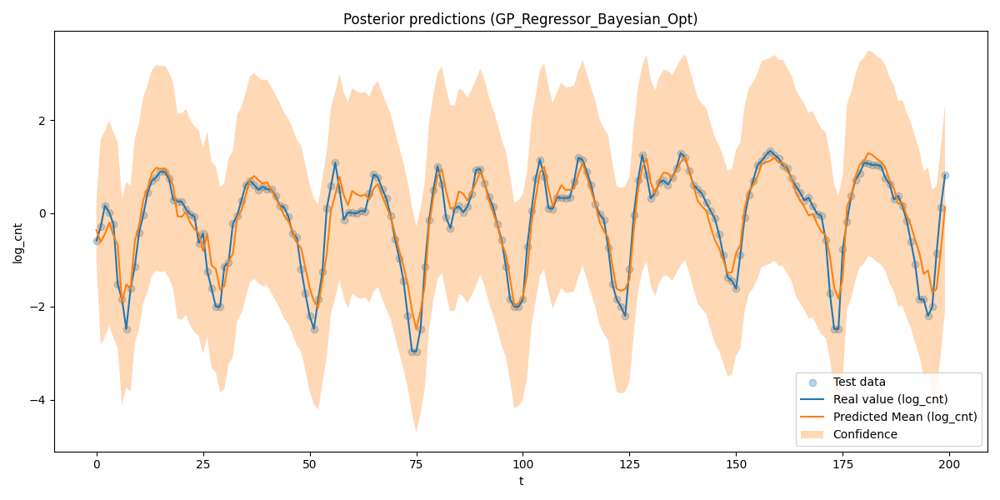

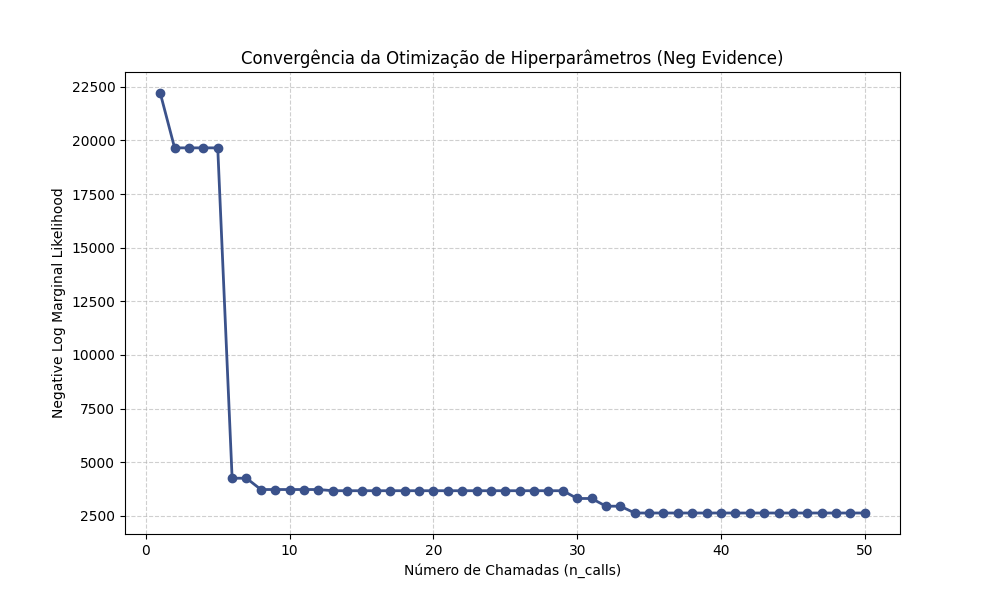


Treinando o modelo BayesianPolynomialRegression...

Melhores hiperparâmetros encontrados para o modelo:

Melhor grau do polinômio: 7
Melhor prior_std: 16.27821530572362
Melhor noise_std: 0.24382518282566745


Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 2.92e-01; MRE = 2.19e-01; NLPD = 1.65e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 5.95e+57; MRE = 4.00e+57; NLPD = 3.69e+00

Tempo de treino: 35.98840880393982 s

Tempo de teste: 0.0027875900268554688 s



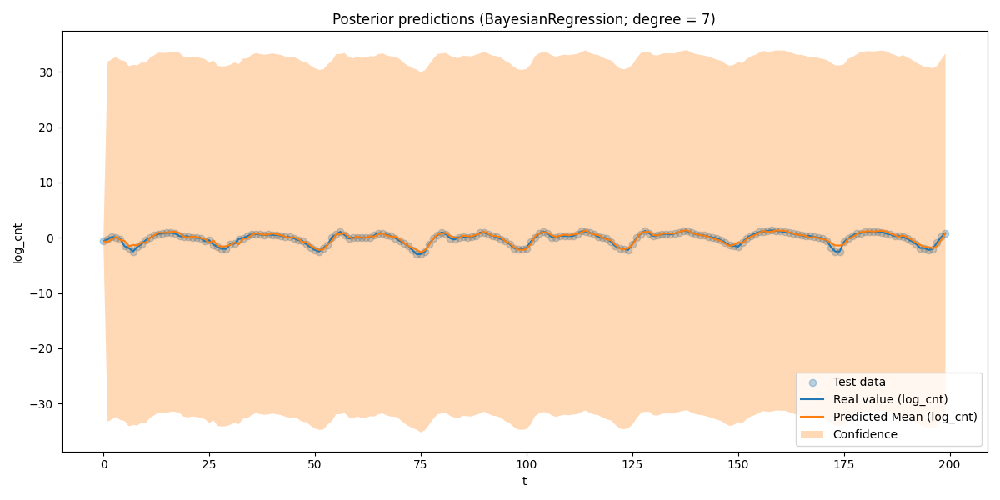

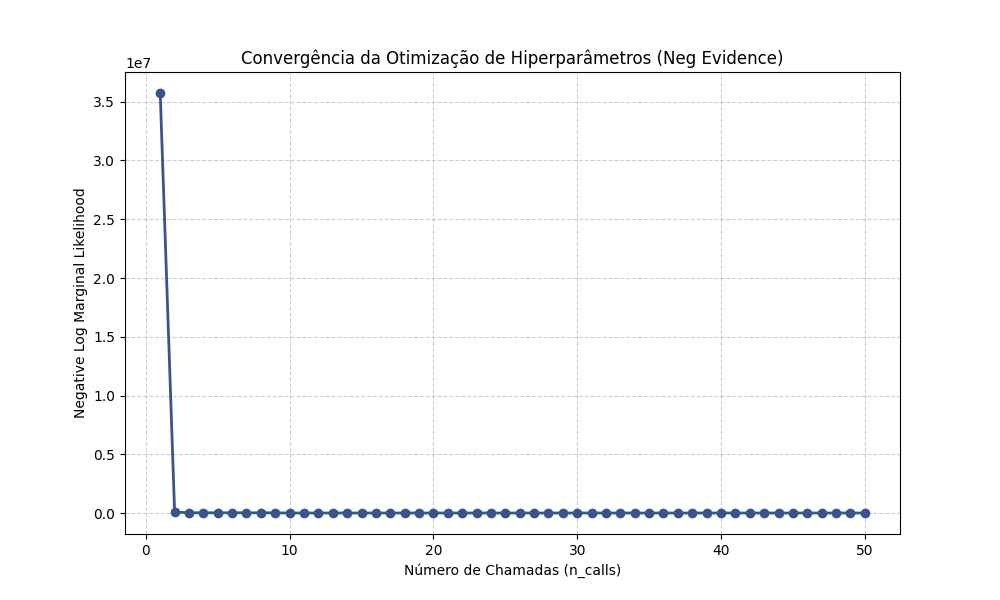

In [ ]:
# @title Testes treinando apenas com dados de 2011 (8000 dados de treino, 200 dados de teste)
print("Bike Sharing Results (yearly training)")
bike_sharing_df = run_pipeline(X_train[:8620], X_train[8620:8820], y_train[:8620], y_train[8620:8820], n_calls=50, cols_to_transform=continuous_cols_encoded, plot=True)

Bike Sharing Results

Treinando o modelo BayesianLinearRegression...

Melhores hiperparâmetros encontrados para o modelo:

Melhor grau do polinômio: 1
Melhor prior_std: 26.415943898717657
Melhor noise_std: 0.32238684191493966


Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 3.53e-01; MRE = 2.69e-01; NLPD = 3.15e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 4.30e-01; MRE = 2.30e-01; NLPD = 3.26e-01

Tempo de treino: 25.85312247276306 s

Tempo de teste: 0.0006346702575683594 s



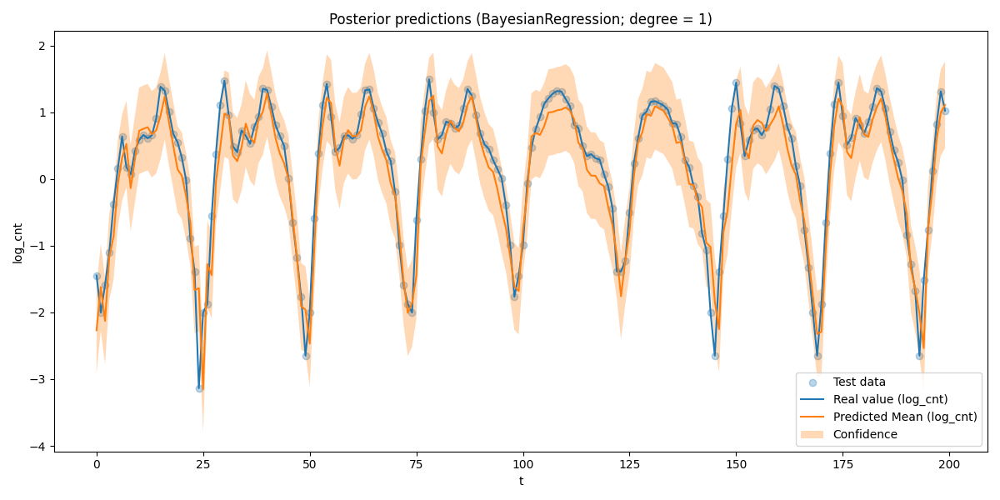

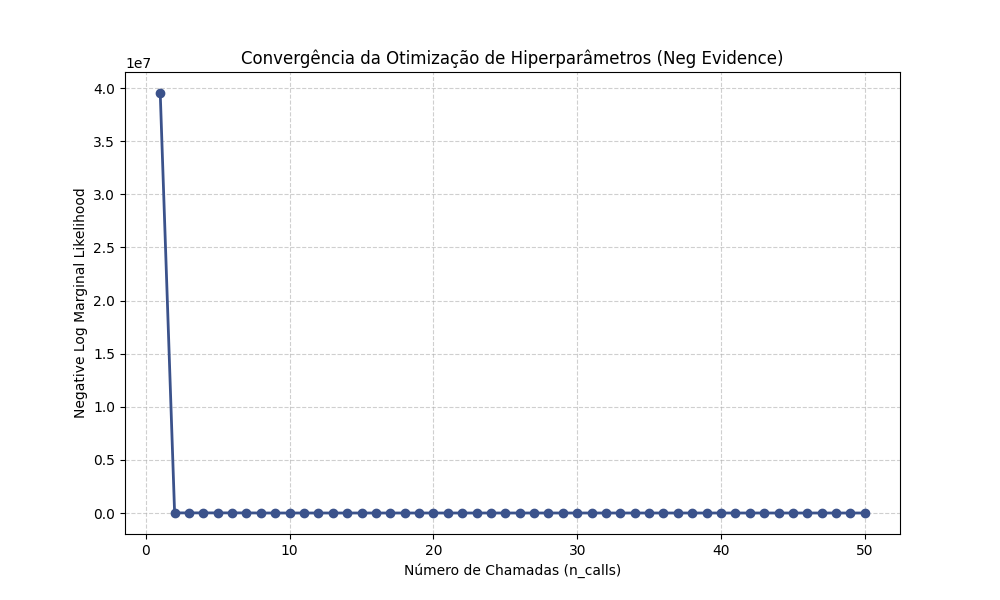


Treinando o modelo GP...

Melhores hiperparâmetros encontrados para o modelo:

Melhor sigma_f: 0.059511294111927994
Melhor w: [1.e+02 1.e+02 1.e+02 1.e-02 1.e-02 1.e+02 1.e-02 1.e-02 1.e-02 1.e-02
 1.e+02 1.e+02 1.e-02 1.e-02 1.e-02 1.e-02 1.e+02 1.e+02 1.e-02 1.e-02
 1.e+02 1.e+02 1.e-02]
Melhor sigma_y: 0.057114749421778695

Ordem de relevância dos atributos (ARD): ['holiday_1' 'weathersit_4' 'std-24h' 'weathersit_1' 'index_day'
 'windspeed' 'hum' 'sin_mnth' 'yr' 'cos_hr' 'workingday_1' 'weathersit_3'
 'weathersit_2' 'med-24h' 'lag-24h' 'temp' 'atemp' 'diff-1h' 'lag-1h'
 'sin_hr' 'sin_weekday' 'cos_weekday' 'cos_mnth']

Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 1.77e-01; MRE = 1.27e-01; NLPD = -1.52e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 4.27e-01; MRE = 2.29e-01; NLPD = 3.25e-01

Tempo de treino: 1891.8762819766998 s

Tempo de teste: 13.062638282775879 s



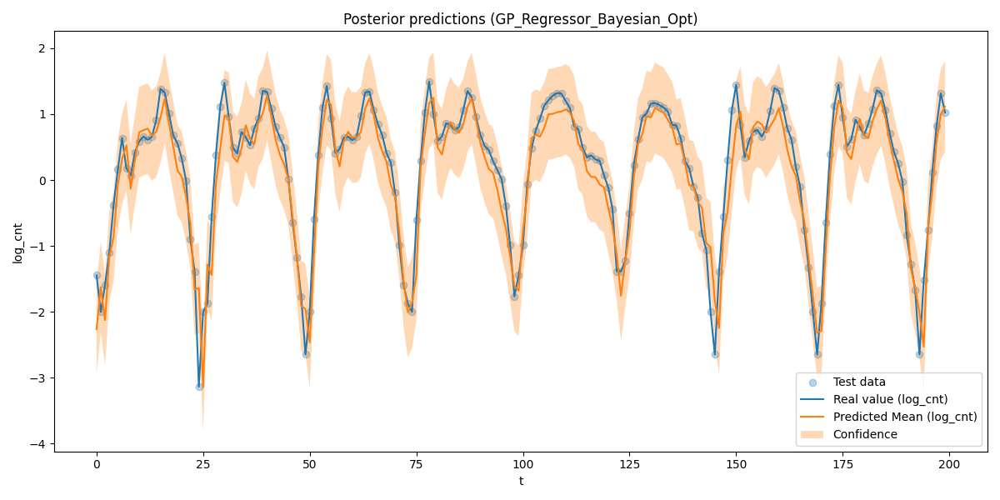

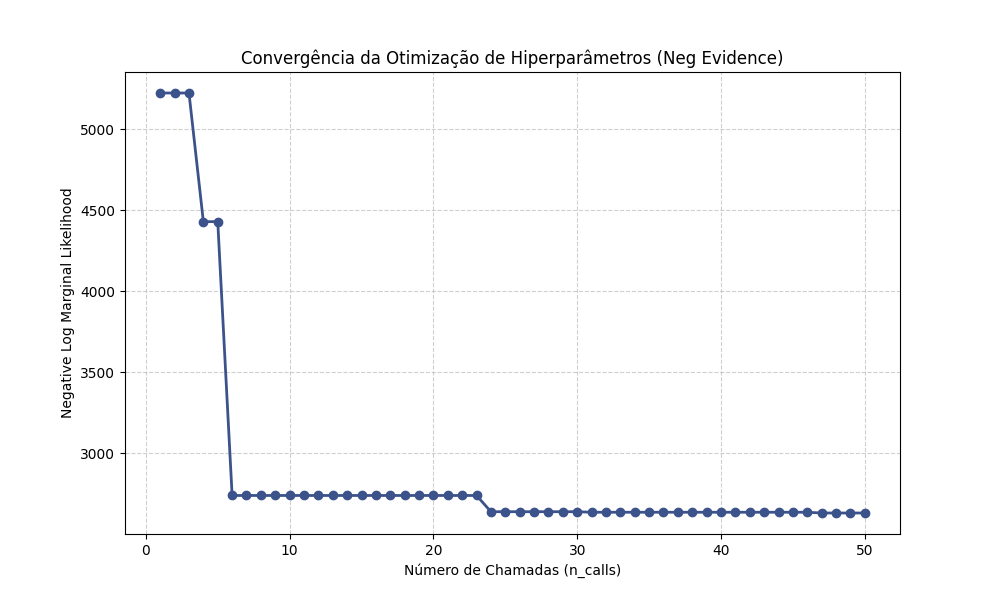


Treinando o modelo BayesianPolynomialRegression...

Melhores hiperparâmetros encontrados para o modelo:

Melhor grau do polinômio: 7
Melhor prior_std: 16.27821530572362
Melhor noise_std: 0.24382518282566745


Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 2.82e-01; MRE = 2.11e-01; NLPD = 1.19e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 3.31e-01; MRE = 1.68e-01; NLPD = 4.52e-02

Tempo de treino: 37.56874752044678 s

Tempo de teste: 0.0024738311767578125 s



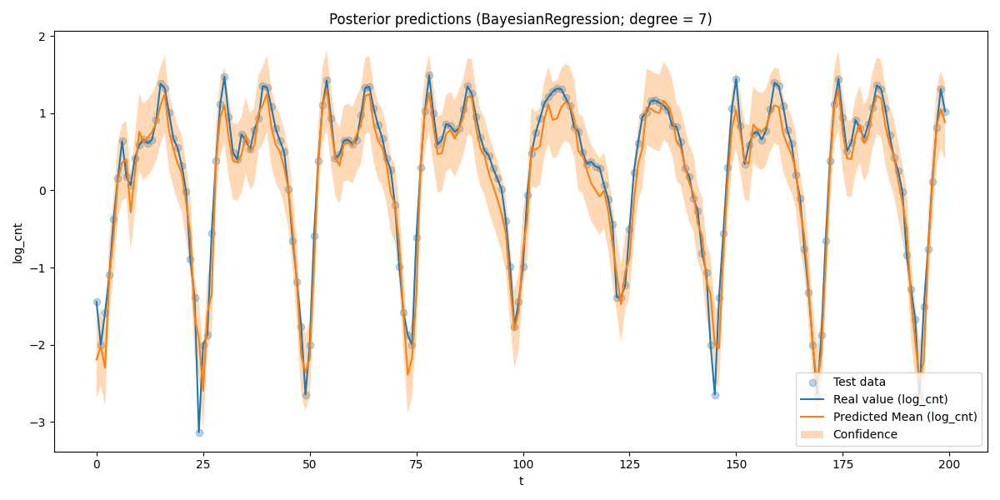

/tmp/ipython-input-1517730755.py:251: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig_conv, ax_conv = plt.subplots(figsize=(10, 6))


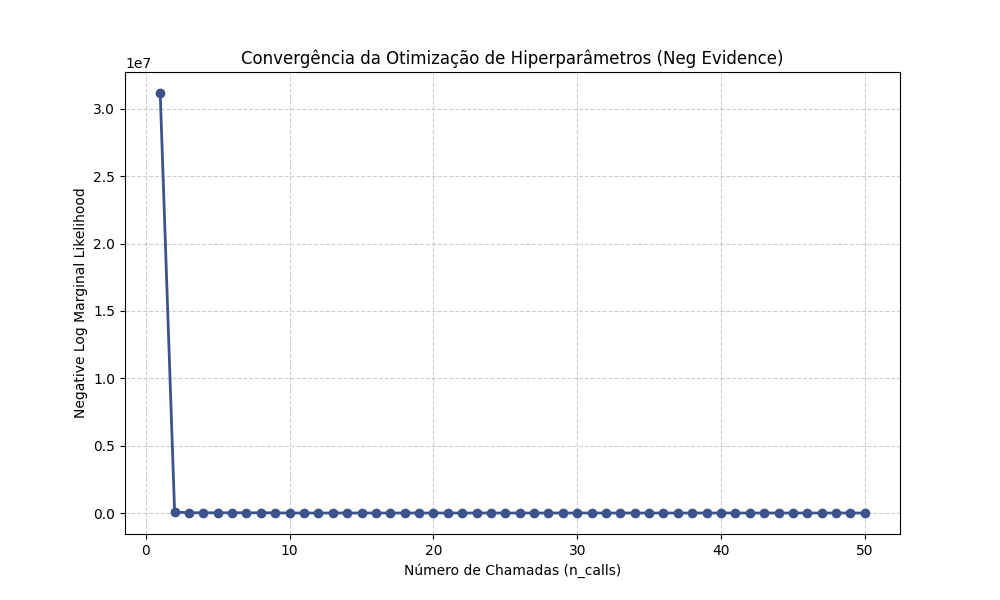

In [ ]:
# @title Testes iniciais (8000 dados de treino, 200 dados de teste)
print("Bike Sharing Results")
# print(f"\nX_train.shape = {X_train[7000:9000].shape}")
# print(f"\nX_test.shape = {X_test[2000:2500].shape}")
# print(f"\ny_train.shape = {y_train[7000:9000].shape}")
# print(f"\ny_test.shape = {y_test[2000:2500].shape}")
bike_sharing_df = run_pipeline(X_train[2000:10000], X_test[2300:2500], y_train[2000:10000], y_test[2300:2500], n_calls=50, cols_to_transform=continuous_cols_encoded, plot=True)

In [ ]:
# @title Tabela de resultados para múltiplas execuções
def table_results(dataframes, metrics):
    for df_name, data in dataframes.items():
        table = pd.DataFrame(data['results_summary']).T

        for metric_key in metrics.values():
            if metric_key in ['rmse', 'mre', 'nlpd']:
                table[metric_key] = table[metric_key].map(
                    lambda x: f"{np.mean(x):.2e} +- {1.96*np.std(x)/np.sqrt(len(x)):.2e}"
                )
            elif metric_key in ['train_time', 'test_time']:
                table[metric_key] = table[metric_key].map(
                    lambda x: f"{np.mean(x):.3f}s +- {1.96*np.std(x)/np.sqrt(len(x)):.3f}s"
                )

        table.rename(columns={v: k for k, v in metrics.items()}, inplace=True)

        def extract_from_text(val):
            return float(val.split(' ')[0].replace('s', ''))

        data['summary_table'] = table.style.apply(
            lambda col: ['font-weight:bold; color:red'
                         if (x.split(' ')[0][-1] != '%' and extract_from_text(x) == col.apply(extract_from_text).min())
                         else '' for x in col]
        )

    return dataframes

In [ ]:
# @title Gráfico de barras comparativo para uma dada métrica
def plot_metric(results_summary, metrics):
    records = []

    for model_name, model_metrics in results_summary.items():
        for metric_name, metric_key in metrics.items():
            scores = model_metrics[metric_key]
            for value in scores:
                records.append({
                    'Modelo': model_name,
                    'Métrica': metric_name,
                    'Valor': value
                })

    df_long = pd.DataFrame.from_records(records)

    for metric_name in metrics.keys():
        df_plot = df_long[df_long['Métrica'] == metric_name]
        plt.figure(figsize=(8, 5))
        ax = sns.barplot(
            data=df_plot,
            x='Modelo',
            y='Valor',
            hue='Modelo',
            legend=False,
            errorbar='ci',
            err_kws={"color": ".6", "linewidth": 1.5},
            capsize=0.5,
            palette='mako' #'Blues_d'
        )
        for container in ax.containers:
            ax.bar_label(container, fontsize=10, fmt="{:.3f}")
        plt.title(f'{metric_name} com Intervalo de Confiança 95%')
        plt.xticks(rotation=40)
        plt.ylabel(metric_name)
        plt.tight_layout()
        plt.grid(linestyle='--')
        plt.show()
    return None

In [ ]:
# @title Comparação entre modelos (original)
def metrics_compare(dataframes, metrics, n_runs=10, plot=False):
    for df_name, data in dataframes.items():
        print(f"\n Comparações - {df_name}")

        data['results_summary'] = {
                                  'BayesianLinearRegression': {},
                                  'BayesianPolynomialRegression': {},
                                  'GP': {}
                                  }

        for name, metric in metrics.items():
            for method, info in data['results_summary'].items():
                data['results_summary'][method][metric] = []

        current_X_train = data['X_train']
        current_X_test = data['X_test']
        current_y_train = data['y_train']
        current_y_test = data['y_test']
        current_cols_to_transform = data['cols_to_transform']


        for i in range(1, n_runs+1):
            print(f"\n\nExecução {i}/{n_runs}")

            results = run_pipeline(current_X_train, current_X_test, \
                                   current_y_train, current_y_test, \
                                   cols_to_transform=current_cols_to_transform, plot=plot)

            for name, metric_key in metrics.items():
                for method, info in results.items():
                    data['results_summary'][method][metric_key].append(float(info[metric_key]))

        plot_metric(data['results_summary'], metrics)
        print("\n\n")

    dataframes = table_results(dataframes, metrics)
    return dataframes

In [ ]:
# @title Convertendo resultados para arquivo .csv e vice-versa
def dict_to_csv(summary, filename):
    records = []
    for model, metrics_dict in summary.items():
        for metric, values_list in metrics_dict.items():
            for run_index, value in enumerate(values_list):
                records.append({
                    'model': model,
                    'metric': metric,
                    'run': run_index,
                    'value': value
                })

    df = pd.DataFrame(records)
    return df.to_csv(filename, index=False)

def load_csv_to_dict(df):
    _dict = {}

    for model, model_group in df.groupby('model'):
        _dict[model] = {}
        for metric, metric_group in model_group.groupby('metric'):
            values = metric_group.sort_values(by='run')['value'].tolist()
            _dict[model][metric] = values
    return _dict

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/



 Comparações - Bike Sharing


Execução 1/1

Treinando o modelo BayesianLinearRegression...

Melhores hiperparâmetros encontrados para o modelo:

Melhor grau do polinômio: 1
Melhor prior_std: 26.415943898717657
Melhor noise_std: 0.32238684191493966


Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 5.99e+01; MRE = 4.40e-01; NLPD = 6.65e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 7.61e+01; MRE = 3.43e-01; NLPD = 6.75e-01

Tempo de treino: 24.69390034675598 s

Tempo de teste: 0.0010235309600830078 s



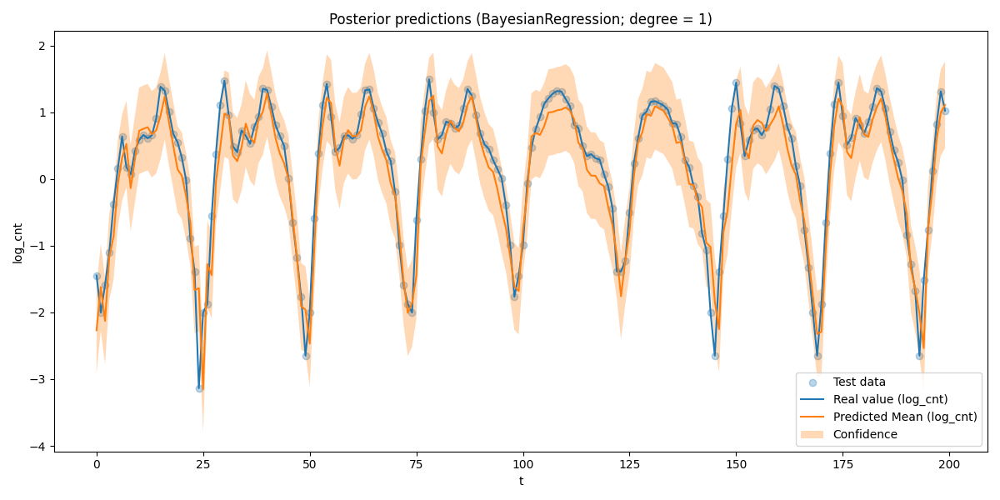

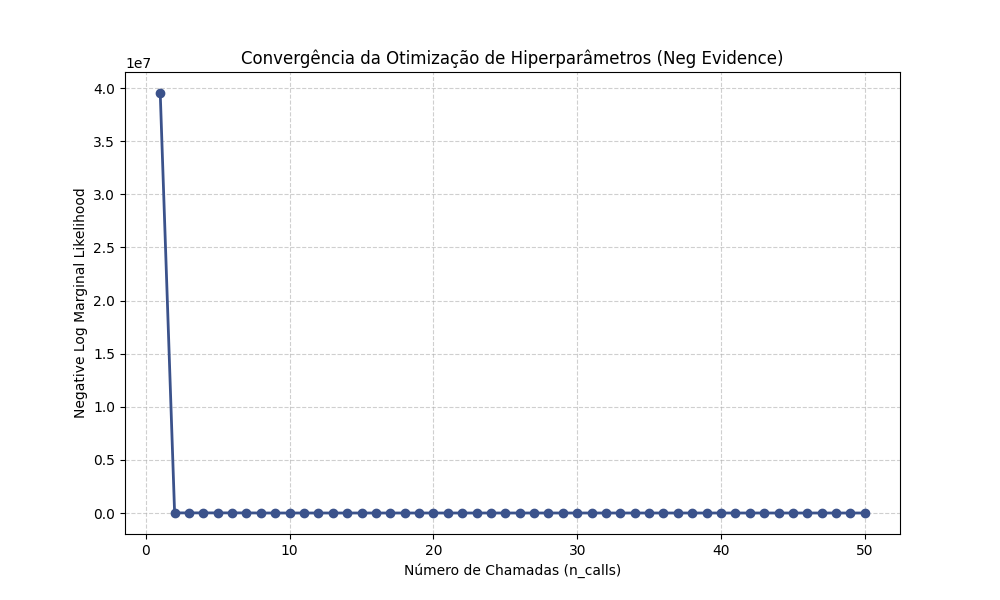


Treinando o modelo GP...

Melhores hiperparâmetros encontrados para o modelo:

Melhor sigma_f: 0.07478100783252883
Melhor w: [4.30327689e-01 3.46076658e+00 3.94305906e+01 1.48626253e-02
 1.67552128e+01 5.07778095e-01 9.56800871e-01 2.48407084e+01
 8.64090061e-01 1.66943870e+01 2.96280011e-01 1.65100788e-02
 8.74902480e-02 1.49488468e-01 4.23710955e+00 3.20954686e+00
 5.87406860e+00 1.46706588e+00 4.72845586e+01 7.52918501e+01
 1.08800944e-02 4.35288199e+00 3.64051463e+00]
Melhor sigma_y: 0.06393540712193099

Ordem de relevância dos atributos (ARD): ['weathersit_3' 'weathersit_2' 'sin_mnth' 'cos_weekday' 'sin_hr' 'atemp'
 'std-24h' 'holiday_1' 'lag-24h' 'workingday_1' 'yr' 'med-24h'
 'weathersit_1' 'sin_weekday' 'temp' 'cos_hr' 'index_day' 'hum' 'diff-1h'
 'lag-1h' 'windspeed' 'cos_mnth' 'weathersit_4']

Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 3.33e+01; MRE = 1.98e-01; NLPD = 2.16e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 7.71e+01; MRE = 3.53e-01;

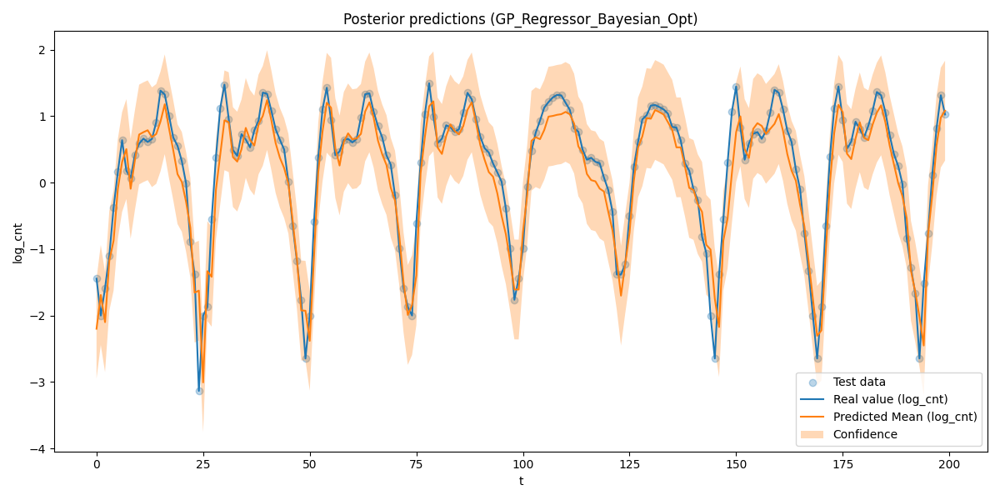

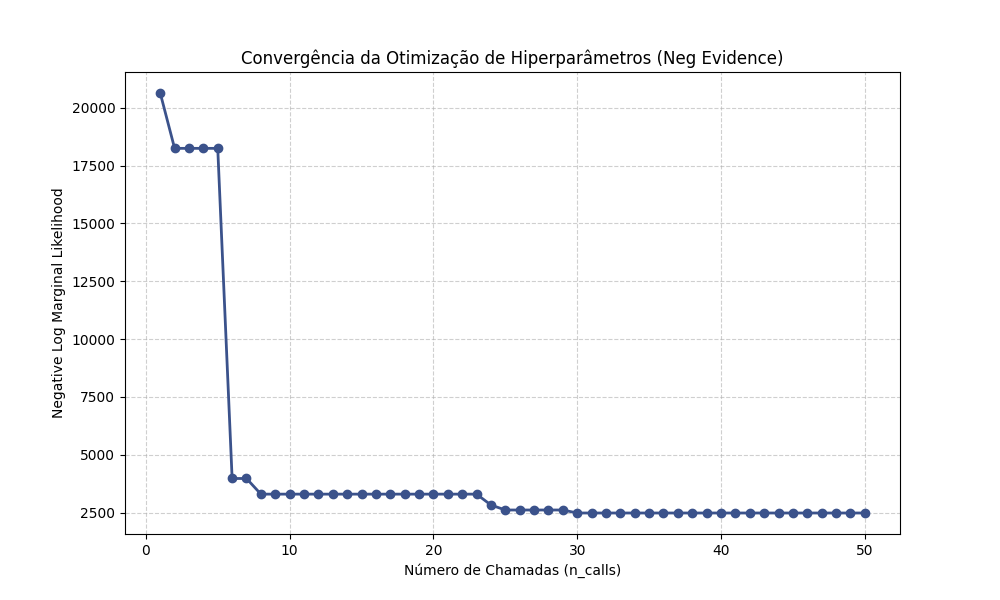


Treinando o modelo BayesianPolynomialRegression...

Melhores hiperparâmetros encontrados para o modelo:

Melhor grau do polinômio: 7
Melhor prior_std: 16.27821530572362
Melhor noise_std: 0.24382518282566745


Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 4.74e+01; MRE = 3.32e-01; NLPD = 4.68e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 5.89e+01; MRE = 2.39e-01; NLPD = 3.94e-01

Tempo de treino: 34.277124881744385 s

Tempo de teste: 0.003017425537109375 s



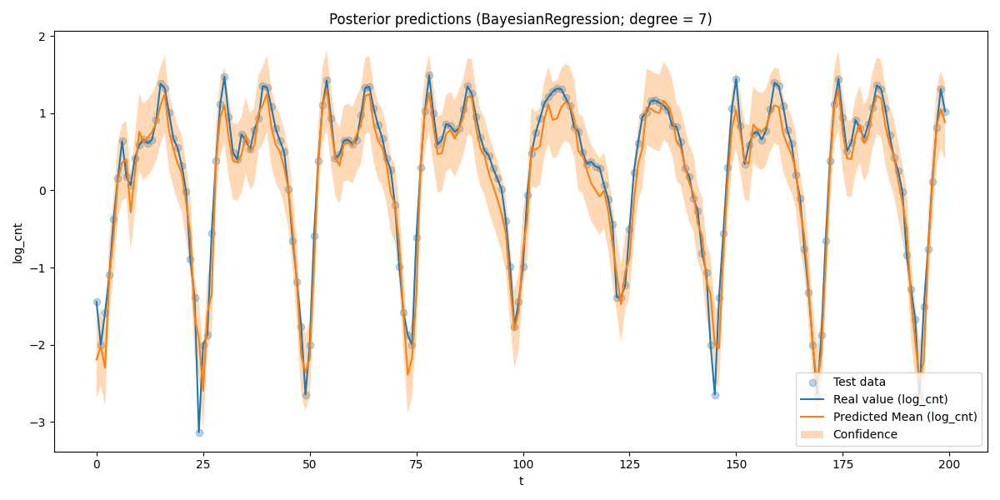

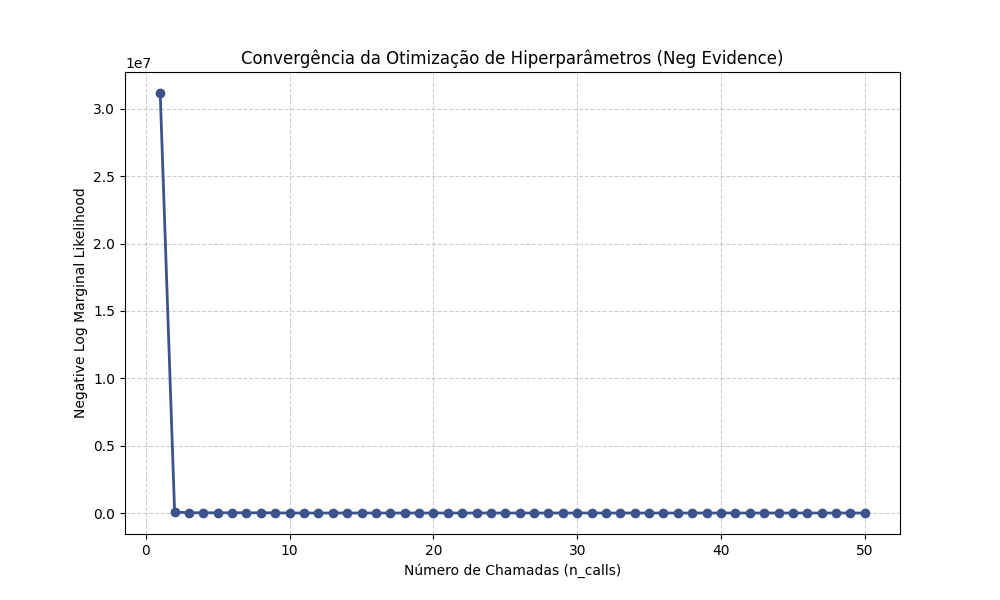

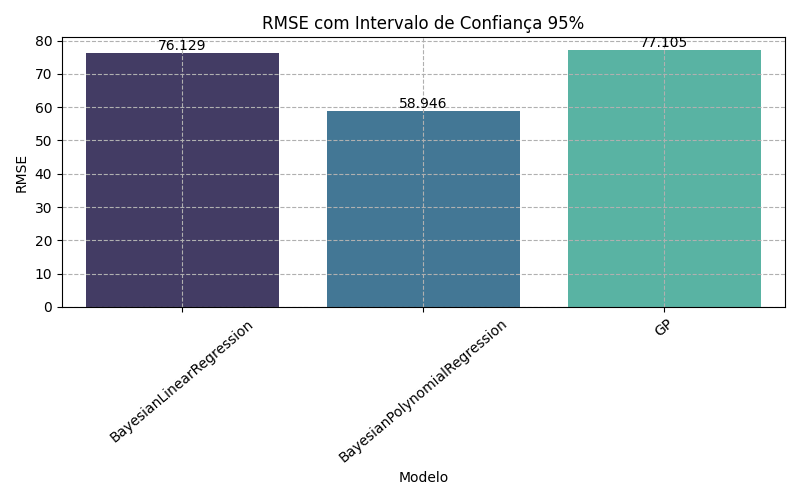

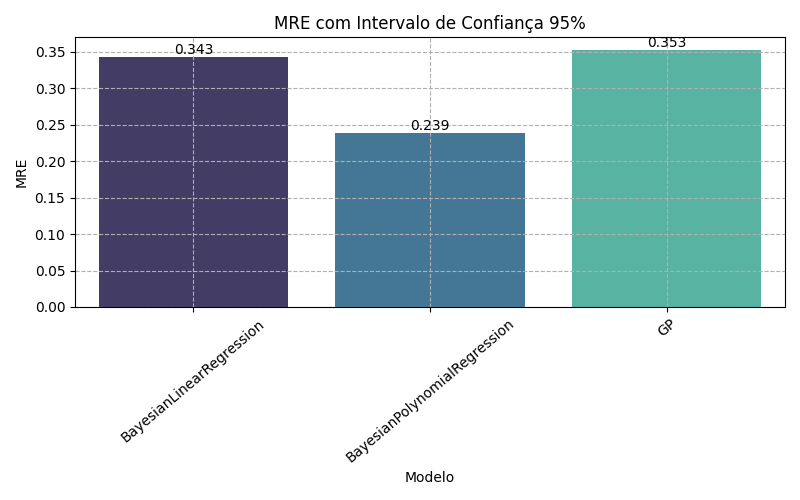

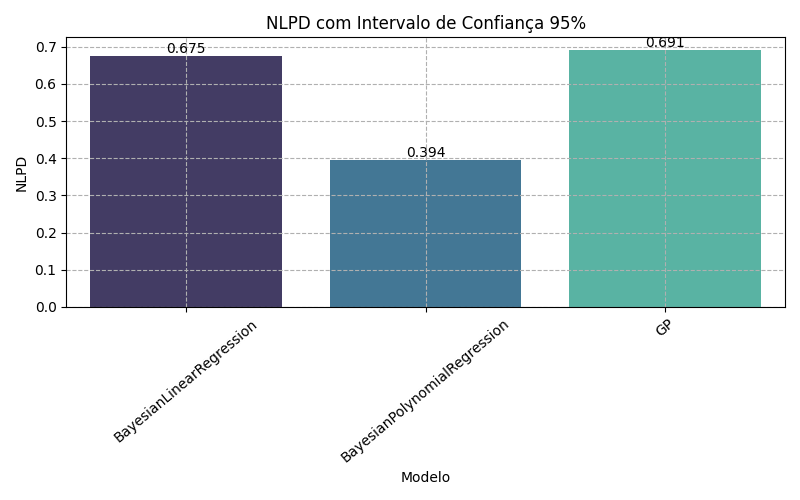

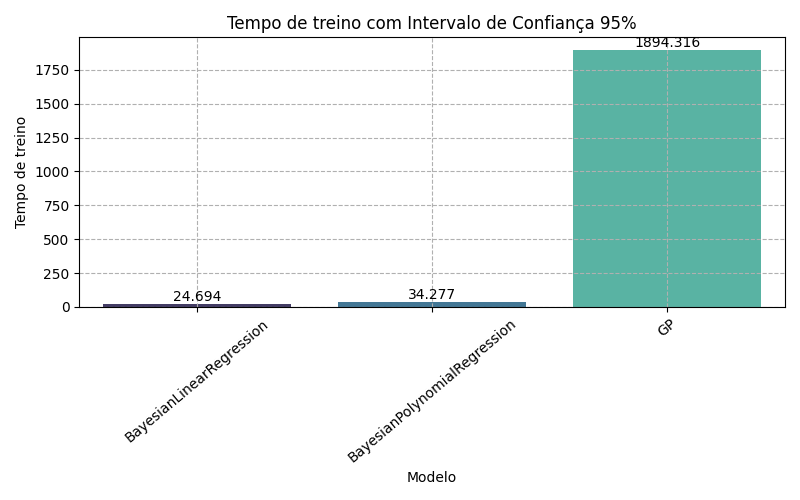

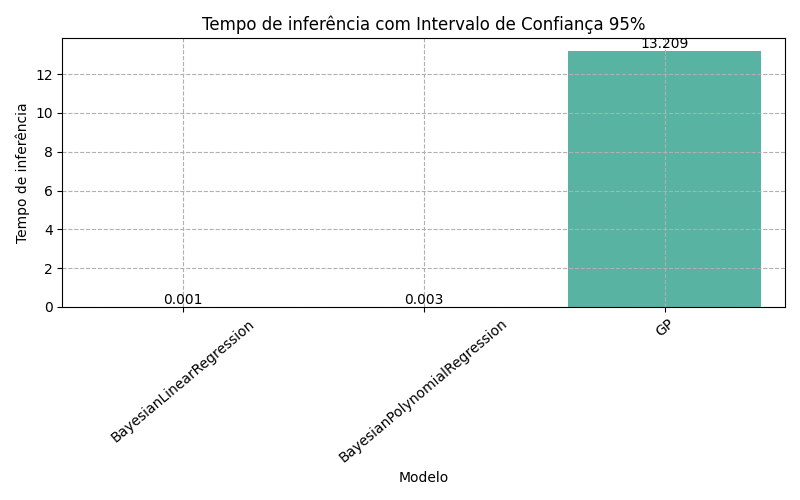

In [ ]:
# @title Obtendo resultados para execução única (dataset reduzido, treino 2011-2012)
selected_X_train = X_train[2000:10000]
selected_X_test = X_test[2300:2500]
selected_y_train = y_train[2000:10000]
selected_y_test = y_test[2300:2500]

dataframes = {
              'Bike Sharing': {
                  'X_train': selected_X_train,
                  'X_test': selected_X_test,
                  'y_train': selected_y_train,
                  'y_test': selected_y_test,
                  'cols_to_transform': continuous_cols_encoded
              }
}

metrics = {
          'RMSE': 'rmse',
          'MRE': 'mre',
          'NLPD': 'nlpd',
          'Tempo de treino': 'train_time',
          'Tempo de inferência': 'test_time'
          }

dataframes_summary_zoomed = metrics_compare(dataframes, metrics, n_runs=1, plot=True)

In [ ]:
# @title Registrando dados dos testes (dataset reduzido, treino 2011-2012)
df_summary_zoomed = dataframes_summary_zoomed['Bike Sharing']['results_summary']

dict_to_csv(df_summary_zoomed, './df_summary_zoomed.csv')

In [ ]:
!cp /content/df_summary_zoomed.csv /content/drive/MyDrive/df_summary_zoomed.csv

In [ ]:
# @title Sumário comparativo dos resultados - Bike Sharing (dataset reduzido, treino 2011-2012)
dataframes_summary_zoomed['Bike Sharing']['summary_table']

,RMSE,MRE,NLPD,Tempo de treino,Tempo de inferência
BayesianLinearRegression,7.61e+01 +- 0.00e+00,3.43e-01 +- 0.00e+00,6.75e-01 +- 0.00e+00,24.694s +- 0.000s,0.001s +- 0.000s
BayesianPolynomialRegression,5.89e+01 +- 0.00e+00,2.39e-01 +- 0.00e+00,3.94e-01 +- 0.00e+00,34.277s +- 0.000s,0.003s +- 0.000s
GP,7.71e+01 +- 0.00e+00,3.53e-01 +- 0.00e+00,6.91e-01 +- 0.00e+00,1894.316s +- 0.000s,13.209s +- 0.000s



 Comparações - Bike Sharing


Execução 1/1

Treinando o modelo BayesianLinearRegression...

Melhores hiperparâmetros encontrados para o modelo:

Melhor grau do polinômio: 1
Melhor prior_std: 26.415943898717657
Melhor noise_std: 0.32238684191493966


Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 5.62e+01; MRE = 4.65e-01; NLPD = 6.97e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = inf; MRE = inf; NLPD = 4.56e+00

Tempo de treino: 24.83812713623047 s

Tempo de teste: 0.0012946128845214844 s



/tmp/ipython-input-1737223110.py:175: RuntimeWarning: overflow encountered in exp
  y_pred = np.exp(mean_pred_unscaled + var_pred_unscaled/2)


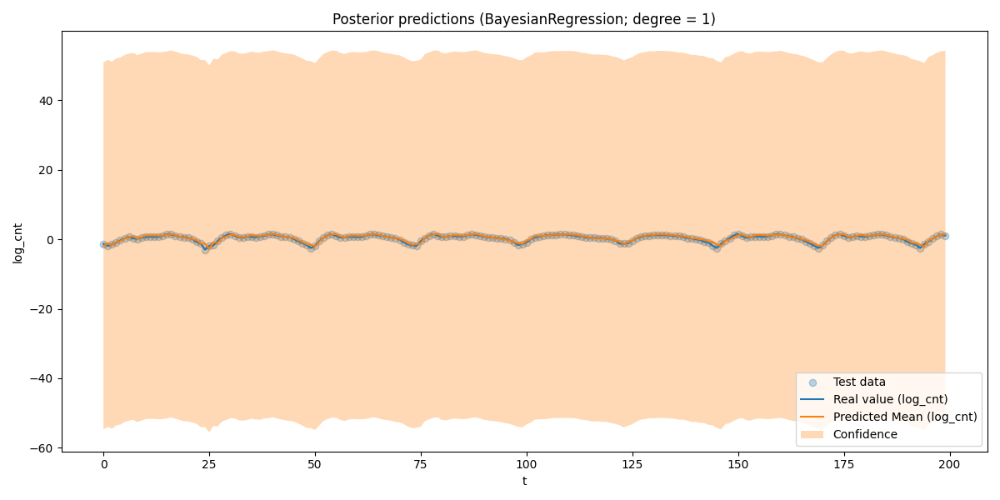

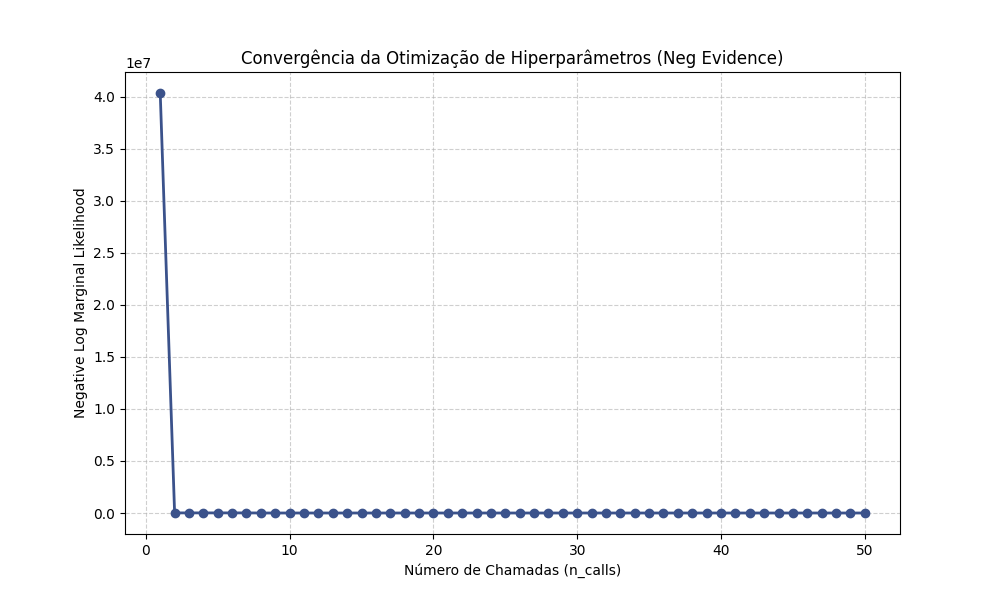


Treinando o modelo GP...

Melhores hiperparâmetros encontrados para o modelo:

Melhor sigma_f: 0.014156544098796587
Melhor w: [1.00000000e-02 1.00000000e+02 9.94747442e+01 1.00000000e+02
 8.57096443e+01 1.00000000e-02 4.16694513e+01 8.55350355e+01
 1.00000000e-02 1.04534966e-02 1.06359363e-02 1.00000000e-02
 1.00000000e-02 1.00000000e-02 6.26852865e-02 1.00000000e-02
 1.00000000e-02 1.00000000e-02 1.00000000e-02 1.00000000e+02
 1.00000000e+02 1.00000000e-02 1.00000000e+02]
Melhor sigma_y: 0.06369325247780289

Ordem de relevância dos atributos (ARD): ['workingday_1' 'weathersit_4' 'weathersit_3' 'yr' 'cos_mnth' 'sin_mnth'
 'sin_hr' 'cos_weekday' 'sin_weekday' 'lag-24h' 'hum' 'atemp'
 'weathersit_1' 'weathersit_2' 'holiday_1' 'std-24h' 'temp' 'diff-1h'
 'lag-1h' 'med-24h' 'windspeed' 'cos_hr' 'index_day']

Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 4.39e+01; MRE = 3.31e-01; NLPD = 4.48e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 7.20e+02; MRE = 3.14e+00

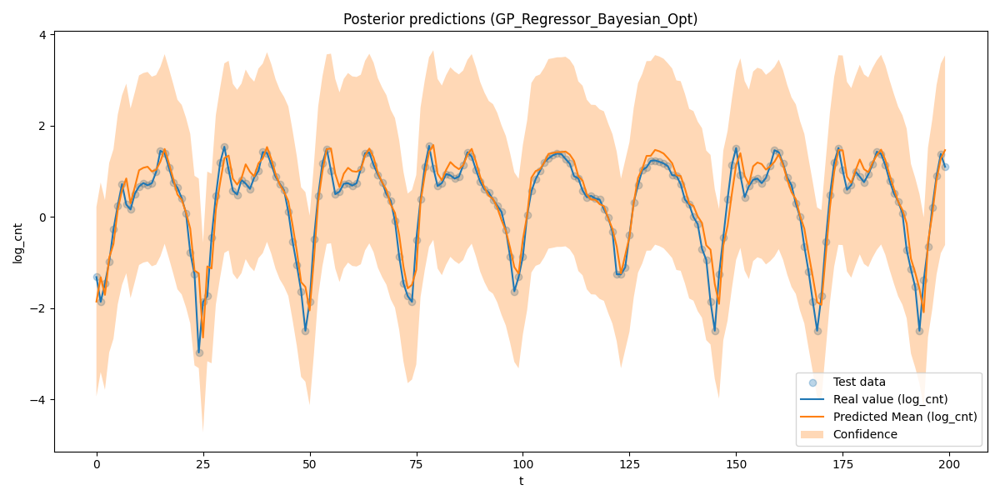

/tmp/ipython-input-2710675161.py:273: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig_conv, ax_conv = plt.subplots(figsize=(10, 6))


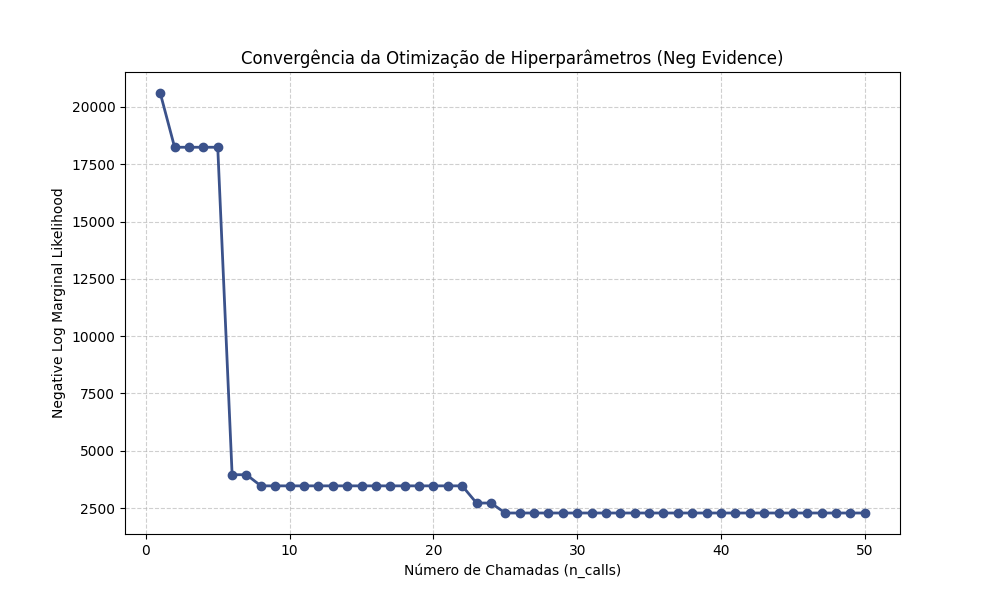


Treinando o modelo BayesianPolynomialRegression...

Melhores hiperparâmetros encontrados para o modelo:

Melhor grau do polinômio: 7
Melhor prior_std: 16.27821530572362
Melhor noise_std: 0.24382518282566745


Valores de RMSE e NLPD para o conjunto de treino:

RMSE = 4.54e+01; MRE = 3.55e-01; NLPD = 5.31e-01


Valores de RMSE e NLPD para o conjunto de teste:

RMSE = 2.24e+123; MRE = 8.83e+120; NLPD = 4.08e+00

Tempo de treino: 33.65763711929321 s

Tempo de teste: 0.03377676010131836 s



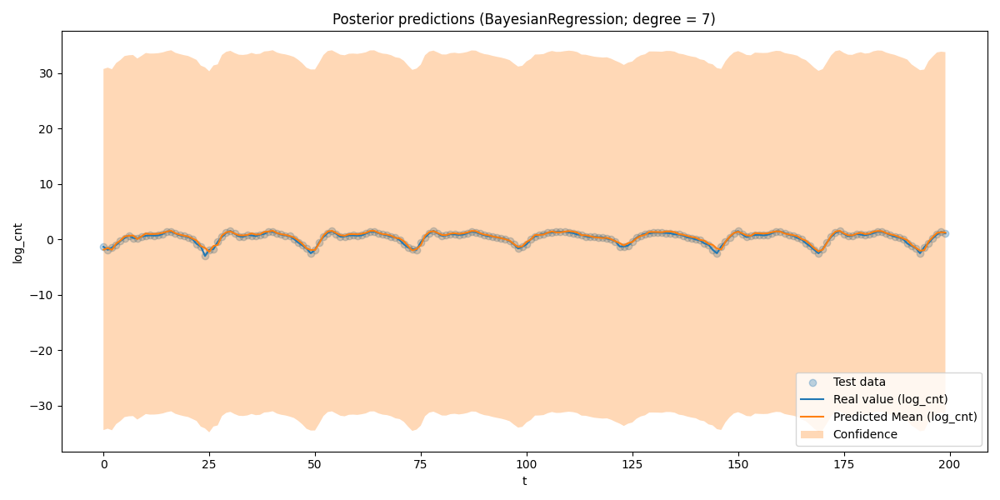

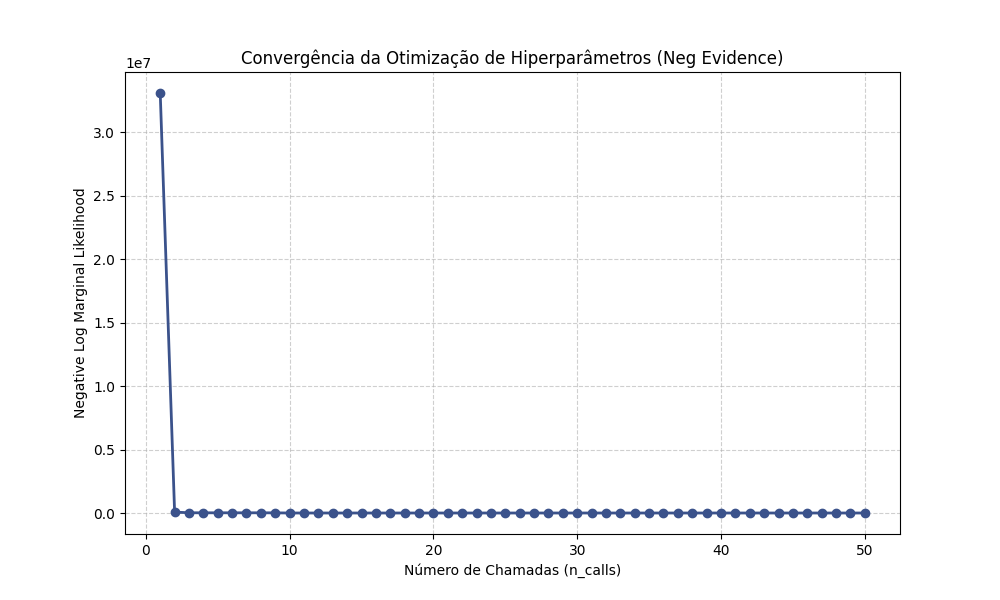

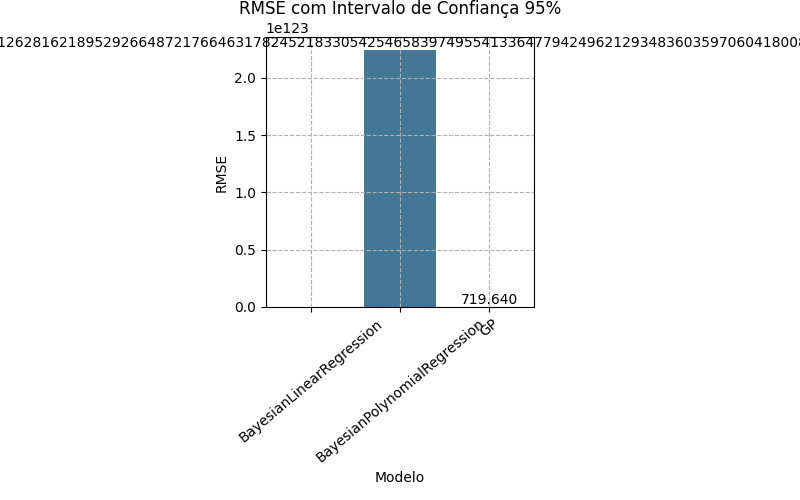

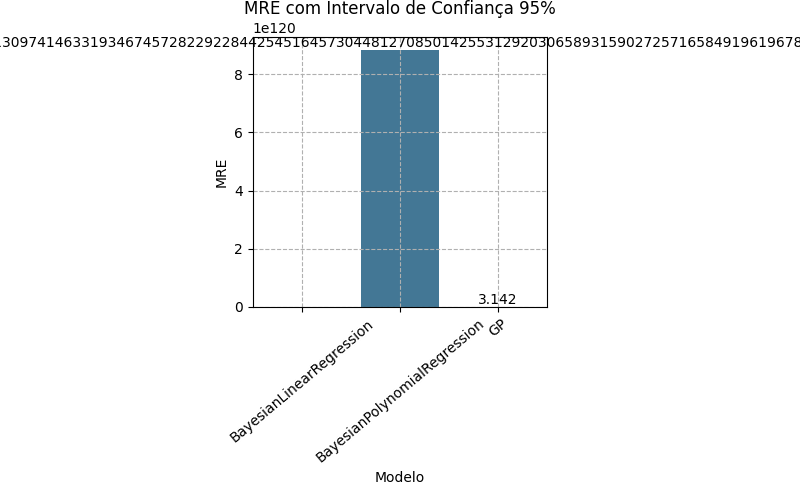

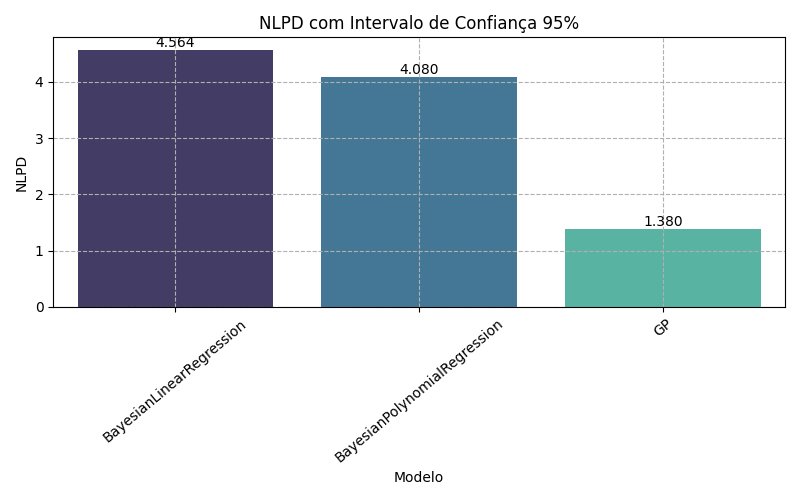

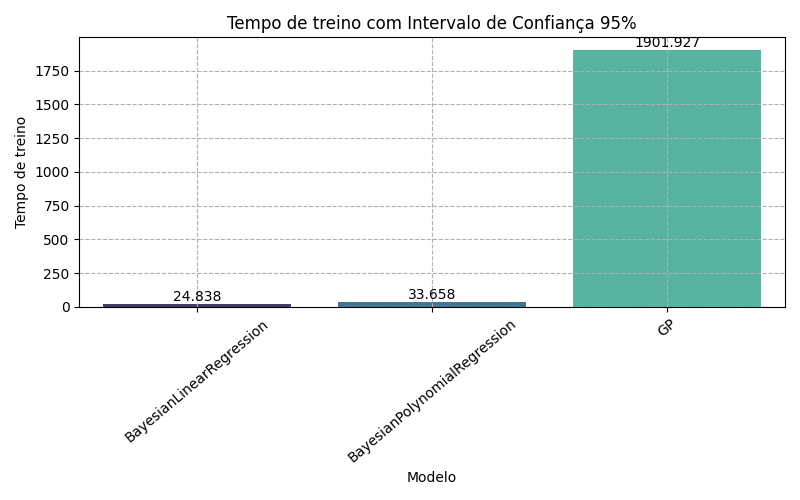

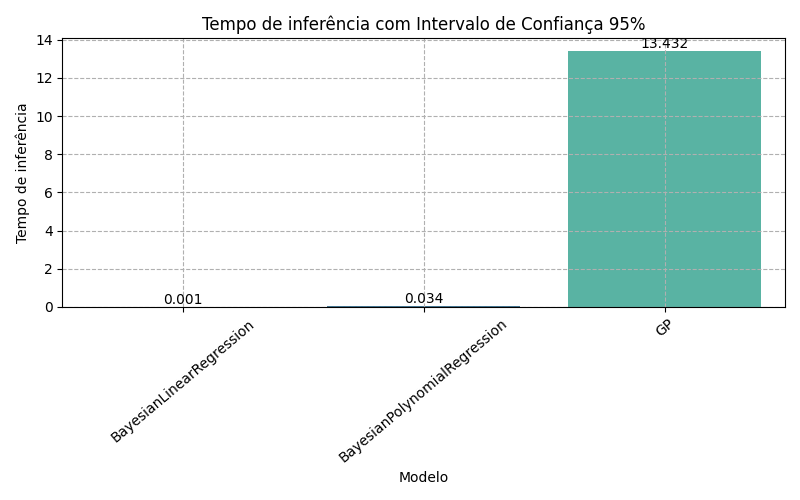

/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:185: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


In [ ]:
# @title Obtendo resultados para execução única (dataset reduzido, treino apenas em 2011)
selected_X_train = X_train[:8000]
selected_X_test = X_test[2300:2500]
selected_y_train = y_train[:8000]
selected_y_test = y_test[2300:2500]

dataframes = {
              'Bike Sharing': {
                  'X_train': selected_X_train,
                  'X_test': selected_X_test,
                  'y_train': selected_y_train,
                  'y_test': selected_y_test,
                  'cols_to_transform': continuous_cols_encoded
              }
}

metrics = {
          'RMSE': 'rmse',
          'MRE': 'mre',
          'NLPD': 'nlpd',
          'Tempo de treino': 'train_time',
          'Tempo de inferência': 'test_time'
          }

dataframes_summary_reduced = metrics_compare(dataframes, metrics, n_runs=1, plot=True)

In [ ]:
# @title Registrando dados dos testes (dataset reduzido, treino apenas em 2011)
df_summary_reduced = dataframes_summary_reduced['Bike Sharing']['results_summary']

dict_to_csv(df_summary_reduced, './df_summary_reduced.csv')

In [ ]:
!cp /content/df_summary_reduced.csv /content/drive/MyDrive/df_summary_reduced.csv

In [ ]:
# @title Sumário comparativo dos resultados - Bike Sharing (dataset reduzido, treino apenas em 2011)
dataframes_summary_reduced['Bike Sharing']['summary_table']

,RMSE,MRE,NLPD,Tempo de treino,Tempo de inferência
BayesianLinearRegression,inf +- nan,inf +- nan,4.56e+00 +- 0.00e+00,24.838s +- 0.000s,0.001s +- 0.000s
BayesianPolynomialRegression,2.24e+123 +- 0.00e+00,8.83e+120 +- 0.00e+00,4.08e+00 +- 0.00e+00,33.658s +- 0.000s,0.034s +- 0.000s
GP,7.20e+02 +- 0.00e+00,3.14e+00 +- 0.00e+00,1.38e+00 +- 0.00e+00,1901.927s +- 0.000s,13.432s +- 0.000s
